`gg-napari-env`

In [3]:
import napari
from napari_czifile2 import napari_get_reader
from cellpose import models, plot, utils, core, models, train
from cellpose.io import logger_setup
import cellpose.io as cio 
import torch 
from skimage import io
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from skimage.measure import find_contours
import pandas as pd
import skimage.exposure as exposure
from skimage.morphology import remove_small_objects
import numpy as np
from skimage.measure import label, regionprops
import seaborn as sns
import os 
import sys 
from skimage.transform import resize
from skimage.filters import threshold_otsu, threshold_yen, try_all_threshold
from skimage.exposure import equalize_adapthist
from skimage.measure import label, regionprops
from scipy.ndimage import binary_erosion, gaussian_filter, binary_dilation, binary_fill_holes
from skimage import exposure
import sys 
from plotting import * 
white_plotting()
import warnings
import matplotlib.font_manager as fm
fm.fontManager.__init__()
warnings.filterwarnings("ignore")
use_GPU = core.use_gpu()
torch.cuda.empty_cache()
print('>>> GPU activated? %d'%use_GPU)
logger_setup()

Initializing plotting package
>>> GPU activated? 1
2025-04-02 11:35:07,232 [INFO] WRITING LOG OUTPUT TO /home/tracking/.cellpose/run.log
2025-04-02 11:35:07,233 [INFO] 
cellpose version: 	3.1.0 
platform:       	linux 
python version: 	3.12.8 
torch version:  	2.5.1+cu124


(<Logger cellpose.io (INFO)>, PosixPath('/home/tracking/.cellpose/run.log'))

In [4]:
def plot_2_channels(results, c1, c2, c1_name, c2_name, c1_color, c2_color, coordinates, image, metadata, all_rois, input, file, 
                    pixel_bounds=100, bbox_expansion=5, normalization=0.0001,
                    dapi_max=255, c1_max=255, c2_max=255): 
    
    # Remove -T from column names
    results.columns = results.columns.str.split('-T').str[0]

    # Make figure directory
    figure_dir = f'../figures/model_B_only_OSNs/{input}/{file.replace(".czi", "")}-{c1_name}-{c2_name}'
    if not os.path.exists(figure_dir):
        os.makedirs(figure_dir)

    # Clear directory
    for f in os.listdir(figure_dir):
        os.remove(os.path.join(figure_dir, f))

    # Normalize intensities for each sample using robust quantile-based normalization 
    # This approach "clips" extreme values without discarding them entirely
    for sample in results['image'].unique():
        results_sample = results[results['image'] == sample]
        for channel in [c1, c2]: 
            lower = results_sample[channel].quantile(normalization)
            upper = results_sample[channel].quantile(1-normalization)
            results_sample[channel] = (results_sample[channel] - lower) / (upper - lower)
            #results_sample[channel] = (results_sample[channel] - results_sample[channel].min()) / (results_sample[channel].max() - results_sample[channel].min())
        results.loc[results['image'] == sample] = results_sample

    # Scatter Plot 
    f, ax = plt.subplots(1, 1, figsize=(2, 2), dpi = 400) 
    sns.scatterplot(data=results, x=c1, y=c2, s=10, ax=ax, color='black', alpha=0.3, lw=0)

    # Plot coordinates using the data from the image 
    results_image = results[results['image'] == file].reset_index(drop=True)
    random_colors = sns.color_palette('colorblind', len(coordinates))
    cells = [] 
    for i, coord in enumerate(coordinates): 
        cell_idx = np.argmin(np.linalg.norm(results_image[[c1, c2]].values - coord, axis=1))
        cell = results_image.iloc[cell_idx].copy()  
        sns.scatterplot(data=pd.DataFrame([cell]), x=c1, y=c2, color=random_colors[i], s=30, ax=ax, lw=0, alpha=1)
        cell["color"] = random_colors[i] 
        cell["number"] = i + 1
        cells.append(cell)
    cells = pd.DataFrame(cells)

    # Plotting 
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_xlabel(f"Normalized {c1_name} Intensity", fontsize=6) 
    ax.set_ylabel(f"Normalized {c2_name} Intensity", fontsize=6)
    ax.tick_params(axis='both', which='major', labelsize=6)

    plt.tight_layout()
    plt.savefig(f"{figure_dir}/{file.replace('.czi', '')}-{c1_name}-{c2_name}-scatter.png", format="png", pad_inches=0, bbox_inches=0, transparent=False)
    plt.show()

    channels = [(i, metadata['name'][i]) for i in range(len(metadata['name']))]
    channels = [(i, channel) for i, channel in channels if any([name in channel for name in ["DAPI", c1, c2]])]

    # Get scale for scale bar 
    x_scale_5 = 5 / metadata['scale'][2] # 5 um in pixels 

    def set_min_max(channel, min_val, max_val):
        if min_val == max_val:
            return np.zeros_like(channel)  # If min == max, return all zeros
        clipped = np.clip(channel, min_val, max_val)
        rescaled = (clipped - min_val) / (max_val - min_val) * 255
        return np.clip(rescaled, 0, 255)  # Ensure the values remain in the [0, 255] range

    for i, cell in cells.iterrows():
        # Retrieve image and z slice 
        x_bounds = int(cell['centroid_x']) - pixel_bounds, int(cell['centroid_x']) + pixel_bounds 
        y_bounds = int(cell['centroid_y']) - pixel_bounds, int(cell['centroid_y']) + pixel_bounds 
        cell_image = image[0, cell['z'], :, y_bounds[0]:y_bounds[1], x_bounds[0]:x_bounds[1]]  # shape: (channels, H, W)

        # Create composite RGB image
        rgb_image = np.zeros((cell_image.shape[1], cell_image.shape[2], 3), dtype=float)  # (H, W, 3)

        # -- DAPI (Grey): add to all channels
        dapi = [idx for idx, channel in channels if 'DAPI' in channel][0]
        dapi_adjusted = set_min_max(cell_image[dapi], 0, dapi_max)
        rgb_image[..., 0] += dapi_adjusted  # Red
        rgb_image[..., 1] += dapi_adjusted  # Green
        rgb_image[..., 2] += dapi_adjusted  # Blue

        # C1 
        c1_index = [idx for idx, channel in channels if c1 in channel][0]
        c1_adjusted = set_min_max(cell_image[c1_index], 0, c1_max) 
        if c1_color == "magenta": 
            rgb_image[..., 0] += c1_adjusted  
            rgb_image[..., 2] += c1_adjusted  
        elif c1_color == "cyan": 
            rgb_image[..., 1] += c1_adjusted
            rgb_image[..., 2] += c1_adjusted
        elif c1_color == "yellow": 
            rgb_image[..., 0] += c1_adjusted
            rgb_image[..., 1] += c1_adjusted

        # -- Cyan (c2): add to green and blue
        c2_index = [idx for idx, channel in channels if c2 in channel][0]
        c2_adjusted = set_min_max(cell_image[c2_index], 0, c2_max)
        if c2_color == "magenta": 
            rgb_image[..., 0] += c2_adjusted  
            rgb_image[..., 2] += c2_adjusted  
        elif c2_color == "cyan": 
            rgb_image[..., 1] += c2_adjusted
            rgb_image[..., 2] += c2_adjusted
        elif c2_color == "yellow": 
            rgb_image[..., 0] += c2_adjusted
            rgb_image[..., 1] += c2_adjusted

        # Normalize composite image to [0,1]
        rgb_image = np.clip(rgb_image/255, 0, 1)

        # Load ROIs and compute bbox (adjusted relative to the cell image)
        regions = regionprops(all_rois[cell['z'], :, :])
        region_labels = [region.label for region in regions]
        region = regions[region_labels.index(cell['z_id'])]
        bbox = region.bbox
        # Expand bbox by bbox_expansion pixels     
        bbox = (bbox[0] - bbox_expansion, bbox[1] - bbox_expansion, 
                bbox[2] + bbox_expansion, bbox[3] + bbox_expansion)
        # Adjust bbox to cell_image coordinates
        bbox = (bbox[0] - y_bounds[0], bbox[1] - x_bounds[0],
                bbox[2] - y_bounds[0], bbox[3] - x_bounds[0])
        # For clarity, unpack bbox (top, left, bottom, right)
        y1, x1, y2, x2 = bbox

        # Create figure with gridspec: main image in left column (spanning all rows) 
        # and three zoom panels in the right column (each taking 1/3 height)
        # Adjust fig size and width ratios as needed.
        fig_width = 1   # total width (main image + zoom panels)
        fig_height = 0.75  # height of the main image (zoom panels share this height)
        f = plt.figure(figsize=(fig_width, fig_height), dpi=400)
        gs = gridspec.GridSpec(nrows=3, ncols=2, width_ratios=[4, 1])
        ax_main = f.add_subplot(gs[:, 0])
        ax_zoom_gray = f.add_subplot(gs[0, 1])
        ax_zoom_magenta = f.add_subplot(gs[1, 1])
        ax_zoom_cyan = f.add_subplot(gs[2, 1])

        # Plot main composite image
        ax_main.imshow(rgb_image)
        ax_main.axis("off")
        # Add border to main image
        ax_main.add_patch(plt.Rectangle((0, 0), cell_image.shape[2]-1, cell_image.shape[1]-1, fill=False, edgecolor=cell['color'], lw=2))
        # Add text legends on main image
        ax_main.text(5, 25, "DAPI", color='white', fontsize=6, weight='bold')
        ax_main.text(5, 45, c1_name, color=c1_color, fontsize=6, weight='bold')
        ax_main.text(5, 65, c2_name, color=c2_color, fontsize=6, weight='bold')
        # Add scale bar on main image
        ax_main.plot([2*pixel_bounds-20-x_scale_5, 2*pixel_bounds-20], 
                    [2*pixel_bounds-20, 2*pixel_bounds-20], color='white', lw=1)
        
        ax_main.add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, fill=False, edgecolor='white', lw=1))

        # ----- Create zoom panels -----
        # Zoom for Grey (DAPI)
        zoom_dapi = dapi_adjusted[y1:y2, x1:x2]
        # Build RGB image: all channels get the DAPI intensity
        dapi_zoom = np.zeros((zoom_dapi.shape[0], zoom_dapi.shape[1], 3), dtype=float)
        dapi_zoom[..., 0] = zoom_dapi
        dapi_zoom[..., 1] = zoom_dapi
        dapi_zoom[..., 2] = zoom_dapi
        dapi_zoom = np.clip(dapi_zoom/255, 0, 1)
        ax_zoom_gray.imshow(dapi_zoom)
        ax_zoom_gray.axis("off")
        ax_zoom_gray.add_patch(plt.Rectangle((0, 0), zoom_dapi.shape[1]-1, zoom_dapi.shape[0]-1, fill=False, edgecolor='grey', lw=1))

        # Zoom for Magenta (c1)
        zoom_c1 = c1_adjusted[y1:y2, x1:x2]
        # Build an RGB image: red and blue channels from c1
        zoom_c1_rgb = np.zeros((zoom_c1.shape[0], zoom_c1.shape[1], 3), dtype=float)
        if c1_color == "magenta": 
            zoom_c1_rgb[..., 0] += zoom_c1  
            zoom_c1_rgb[..., 2] += zoom_c1  
        elif c1_color == "cyan": 
            zoom_c1_rgb[..., 1] += zoom_c1
            zoom_c1_rgb[..., 2] += zoom_c1
        elif c1_color == "yellow": 
            zoom_c1_rgb[..., 0] += zoom_c1
            zoom_c1_rgb[..., 1] += zoom_c1
        zoom_c1_rgb = np.clip(zoom_c1_rgb/255, 0, 1)
        ax_zoom_magenta.imshow(zoom_c1_rgb)
        ax_zoom_magenta.axis("off")
        ax_zoom_magenta.add_patch(plt.Rectangle((0, 0), zoom_c1.shape[1]-1, zoom_c1.shape[0]-1, fill=False, edgecolor=c1_color, lw=1))

        # Zoom for Cyan (c2)
        zoom_c2 = c2_adjusted[y1:y2, x1:x2]
        # Build an RGB image: green and blue channels from c2
        zoom_c2_rgb = np.zeros((zoom_c2.shape[0], zoom_c2.shape[1], 3), dtype=float)
        if c2_color == "magenta": 
            zoom_c2_rgb[..., 0] += zoom_c2  
            zoom_c2_rgb[..., 2] += zoom_c2  
        elif c2_color == "cyan": 
            zoom_c2_rgb[..., 1] += zoom_c2
            zoom_c2_rgb[..., 2] += zoom_c2
        elif c2_color == "yellow": 
            zoom_c2_rgb[..., 0] += zoom_c2
            zoom_c2_rgb[..., 1] += zoom_c2
        zoom_c2_rgb = np.clip(zoom_c2_rgb/255, 0, 1)
        ax_zoom_cyan.imshow(zoom_c2_rgb)
        ax_zoom_cyan.axis("off")
        ax_zoom_cyan.add_patch(plt.Rectangle((0, 0), zoom_c2.shape[1]-1, zoom_c2.shape[0]-1, fill=False, edgecolor=c2_color, lw=1))

        plt.tight_layout(pad=0)
        plt.savefig(f"{figure_dir}/{file.replace('.czi', '')}-{c1_name}-{c2_name}-cell_{cell["number"]}.png",
                    format="png", pad_inches=0, bbox_inches='tight', transparent=False)
        plt.show()

# Plotting

## T79-intergenics-B2-647 & T79-exonic-B1-546 & DAPI 

In [5]:
input = '20250328 1 P14 T79-intergenic-b2-647 T79-exonic-b1-546 DAPI'
results_dir = f'../results/{input}'
results_files = os.listdir(results_dir)
results_files = [f for f in results_files if f.endswith('.csv')]

# Load all results 
results = pd.DataFrame() 
for f in results_files:
    results_path = os.path.join(results_dir, f)
    results = pd.concat([results, pd.read_csv(results_path)], axis=0) 

results

,z_id,image,z,count,area,centroid_x,centroid_y,AF546-T1,AF647-T2
0,1,20250328 1 T79 sample 5.czi,7,0,4.476379,864.513800,1423.940552,2.853503,3.053079
1,2,20250328 1 T79 sample 5.czi,7,1,7.764759,826.358629,1460.662179,2.729498,3.958384
2,3,20250328 1 T79 sample 5.czi,7,2,7.603191,845.700000,1489.727500,2.983750,4.095000
3,4,20250328 1 T79 sample 5.czi,7,3,7.403607,817.290116,1500.872914,3.251605,3.774069
4,5,20250328 1 T79 sample 5.czi,7,4,5.379258,844.183746,1523.973498,2.957597,4.212014
...,...,...,...,...,...,...,...,...,...
21609,3,20250328 1 T79 sample 1.czi,78,21609,6.006521,1005.564873,1039.208861,57.867089,19.531646
21610,4,20250328 1 T79 sample 1.czi,78,21610,5.920985,997.417335,1069.741573,58.634029,19.634029
21611,5,20250328 1 T79 sample 1.czi,78,21611,5.265210,959.285199,1072.756318,59.323105,20.770758
21612,6,20250328 1 T79 sample 1.czi,78,21612,5.160666,1012.611418,1096.795580,59.712707,16.421731


In [6]:
file_number = 2
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

Loaded ../raw-data/20250328 1 P14 T79-intergenic-b2-647 T79-exonic-b1-546 DAPI/20250328 1 T79 sample 3.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'DAPI-T2', 'AF647-T2']}
Image shape: (1, 88, 3, 2048, 2048)
Loaded ../results/20250328 1 P14 T79-intergenic-b2-647 T79-exonic-b1-546 DAPI/20250328 1 T79 sample 3_rois.npy


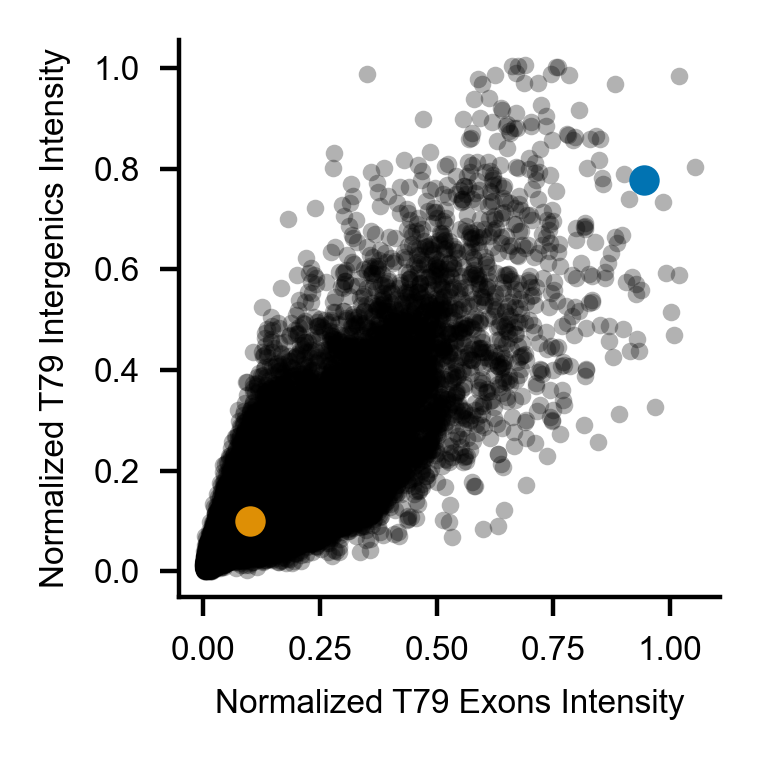

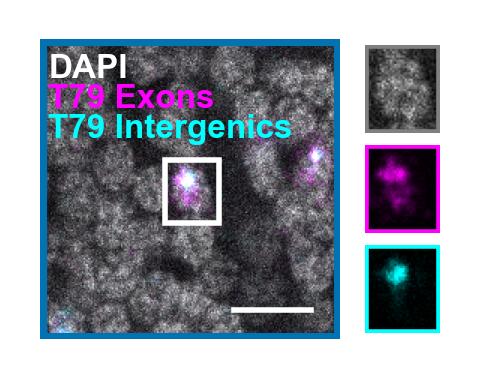

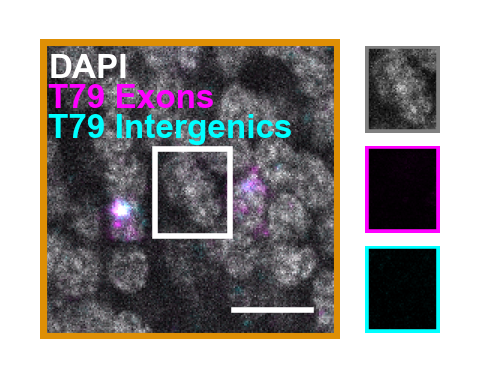

In [13]:
# T79-intergenic-b2-647 T79-exonic-b1-546 DAPI
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1="AF546", c2="AF647", 
                c1_name="T79 Exons", c2_name="T79 Intergenics", 
                c1_color="magenta", c2_color="cyan",
                coordinates=[[0.9, 0.8], [0.1, 0.1]], normalization=0.00001,
                dapi_max=200, c1_max=150, c2_max=200)

## G1-B1-546 & Lnc7-B2-647 & DAPI 

In [19]:
input = '20250325 5 p14 g1-b1-546 lnc7-b2-647 dapi'
results_dir = f'../results/{input}'
results_files = os.listdir(results_dir)
results_files = [f for f in results_files if f.endswith('.csv')]

# Load all results 
results = pd.DataFrame() 
for f in results_files:
    results_path = os.path.join(results_dir, f)
    results = pd.concat([results, pd.read_csv(results_path)], axis=0) 

results

,z_id,image,z,count,area,centroid_x,centroid_y,AF546-T1,AF647-T2
0,1,20250325 5 G1 lncrna sample 3 great.czi,1,0,4.058203,953.016393,928.482436,1.351288,1.430913
1,4,20250325 5 G1 lncrna sample 3 great.czi,1,1,6.576760,1347.745665,1050.947977,1.384393,1.475434
2,1,20250325 5 G1 lncrna sample 3 great.czi,2,2,5.825945,972.296900,871.422512,1.412724,1.371941
3,3,20250325 5 G1 lncrna sample 3 great.czi,2,3,6.481720,997.365103,886.473607,1.441349,1.406158
4,4,20250325 5 G1 lncrna sample 3 great.czi,2,4,7.289559,951.877445,892.951760,1.468057,1.659713
...,...,...,...,...,...,...,...,...,...
27763,18,20250325 5 G1 lncrna sample 4 great.czi,74,27763,5.721401,922.147841,1131.983389,2.659468,2.784053
27764,19,20250325 5 G1 lncrna sample 4 great.czi,74,27764,7.926327,884.737410,1138.748201,3.569544,2.669065
27765,20,20250325 5 G1 lncrna sample 4 great.czi,74,27765,7.166008,944.299735,1155.330239,3.063660,2.746684
27766,21,20250325 5 G1 lncrna sample 4 great.czi,74,27766,4.466875,1195.640426,1295.904255,97.774468,65.568085


In [20]:
file_number = 0
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

Loaded ../raw-data/20250325 5 p14 g1-b1-546 lnc7-b2-647 dapi/20250325 5 G1 lncrna sample 3 great.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 26963.05012512207, 29876.29608154297), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'DAPI-T2', 'AF647-T2']}
Image shape: (1, 73, 3, 2048, 2048)
Loaded ../results/20250325 5 p14 g1-b1-546 lnc7-b2-647 dapi/20250325 5 G1 lncrna sample 3 great_rois.npy


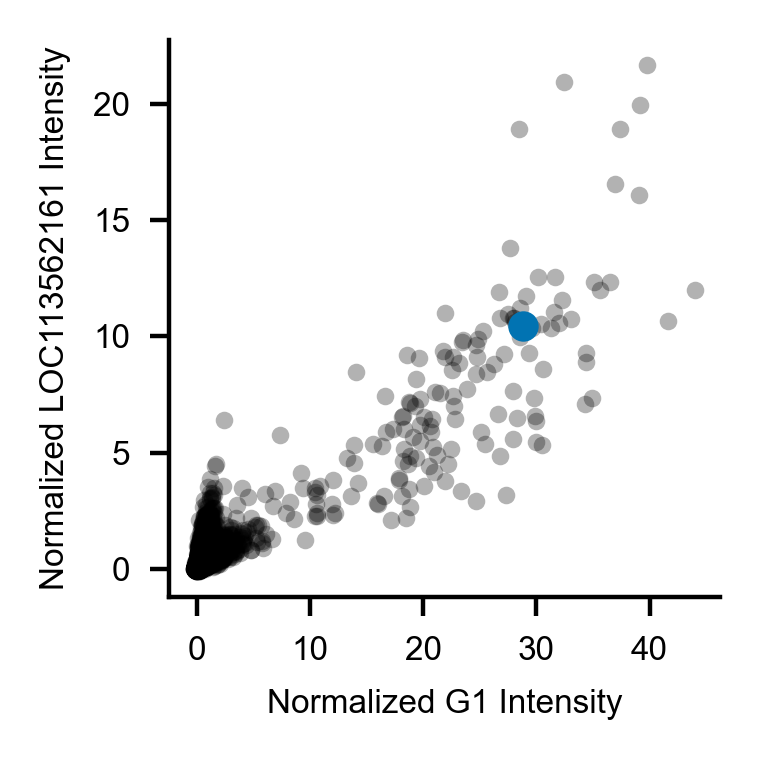

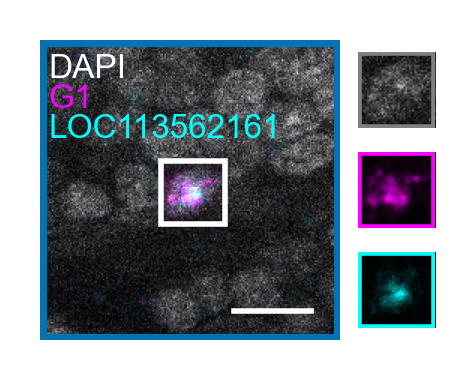

In [25]:
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1="AF546", c2="AF647", 
                c1_name="G1", c2_name="LOC113562161", 
                coordinates=[[30, 10]], 
                dapi_max=100, c1_max=150, c2_max=200)

## R2-b3-488 Q1-b1-546 Lnc6-b2-647

In [3]:
input = '20250328 2 P14 R2-b3-488 Q1-b1-546 Lnc6-b2-647 DAPI'
results_dir = f'../results/{input}'
results_files = os.listdir(results_dir)
results_files = [f for f in results_files if f.endswith('.csv')]

# Load all results 
results = pd.DataFrame() 
for f in results_files:
    results_path = os.path.join(results_dir, f)
    results = pd.concat([results, pd.read_csv(results_path)], axis=0) 

results

,z_id,image,z,count,area,centroid_x,centroid_y,AF546-T1,AF488-T2,AF647-T3
0,1,20250328 2 Q1lnc sample 4.czi,27,0,7.622199,1232.568579,850.209476,4.433915,14.751870,3.897756
1,2,20250328 2 Q1lnc sample 4.czi,27,1,7.726743,1199.225092,869.398524,4.354244,14.261993,3.079951
2,3,20250328 2 Q1lnc sample 4.czi,27,2,6.063545,1143.921630,894.145768,4.916928,18.391850,3.007837
3,4,20250328 2 Q1lnc sample 4.czi,27,3,5.502810,1038.272884,1104.911917,4.148532,14.569948,2.708117
4,5,20250328 2 Q1lnc sample 4.czi,27,4,7.394103,1012.088689,1116.136247,3.483290,14.643959,2.898458
...,...,...,...,...,...,...,...,...,...,...
25786,2,20250328 2 Q1lnc sample 1.czi,80,25786,6.633784,1057.196275,809.113181,12.464183,22.143266,7.485673
25787,3,20250328 2 Q1lnc sample 1.czi,80,25787,6.215609,1096.162080,815.989297,13.249235,20.642202,7.740061
25788,4,20250328 2 Q1lnc sample 1.czi,80,25788,5.711897,912.981697,1011.319468,11.299501,21.096506,9.737105
25789,5,20250328 2 Q1lnc sample 1.czi,80,25789,8.211446,944.787037,1029.505787,10.047454,21.978009,8.013889


In [4]:
file_number = 0
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

Loaded ../raw-data/20250328 2 P14 R2-b3-488 Q1-b1-546 Lnc6-b2-647 DAPI/20250328 2 Q1lnc sample 4.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'AF488-T2', 'DAPI-T3', 'AF647-T3']}
Image shape: (1, 103, 4, 2048, 2048)
Loaded ../results/20250328 2 P14 R2-b3-488 Q1-b1-546 Lnc6-b2-647 DAPI/20250328 2 Q1lnc sample 4_rois.npy


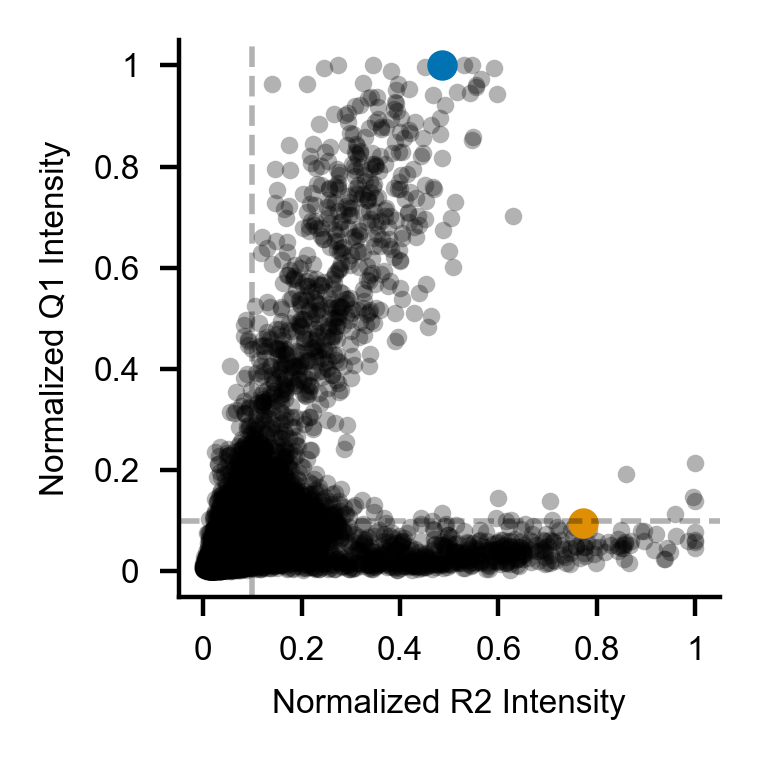

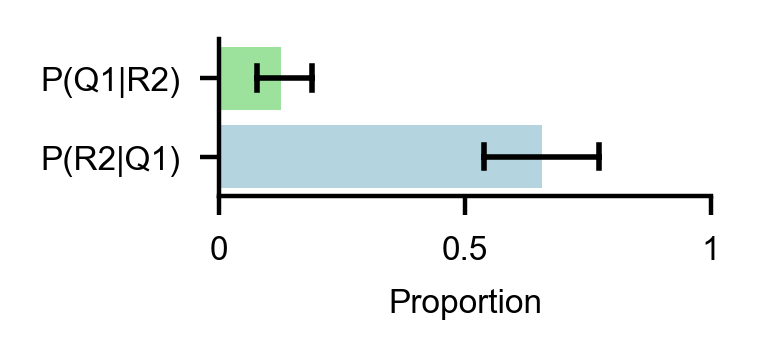

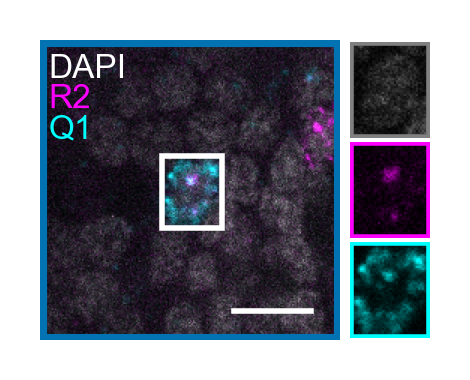

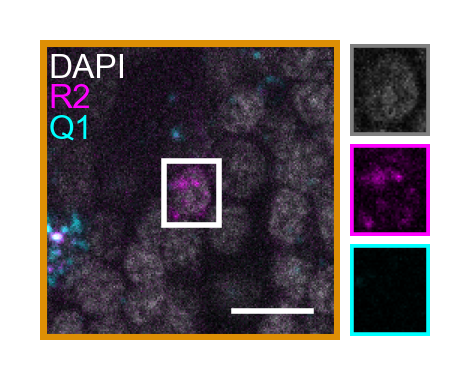

In [5]:
# R2-b3-488 Q1-b1-546 Lnc6-b2-647
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1_thresh=0.1, c2_thresh=0.1,
                c1="AF488", c2="AF546", 
                c1_name="R2", c2_name="Q1", 
                coordinates=[[0.4, 1], [0.8, 0.2]], 
                dapi_max=255, c1_max=150, c2_max=200)

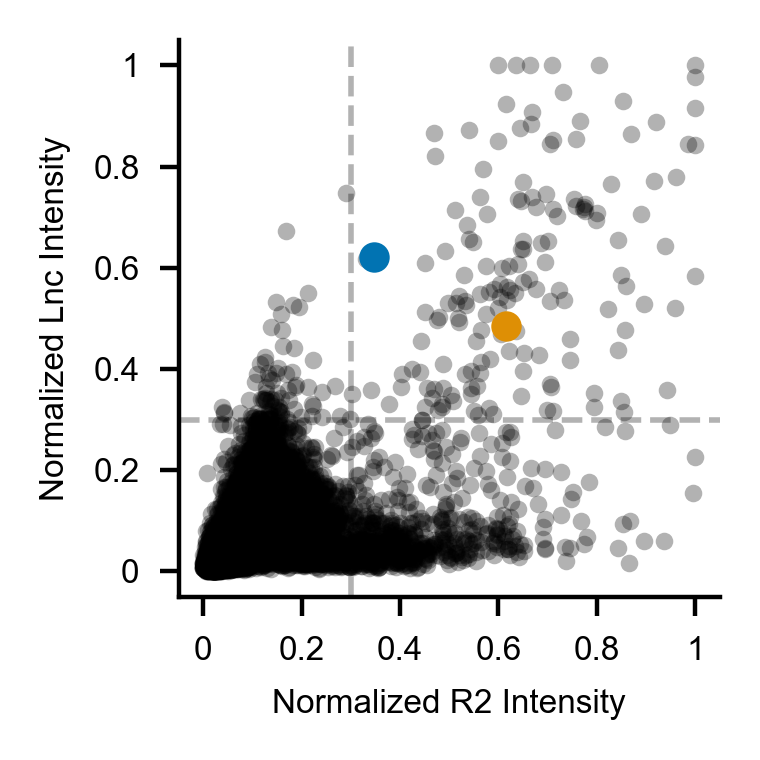

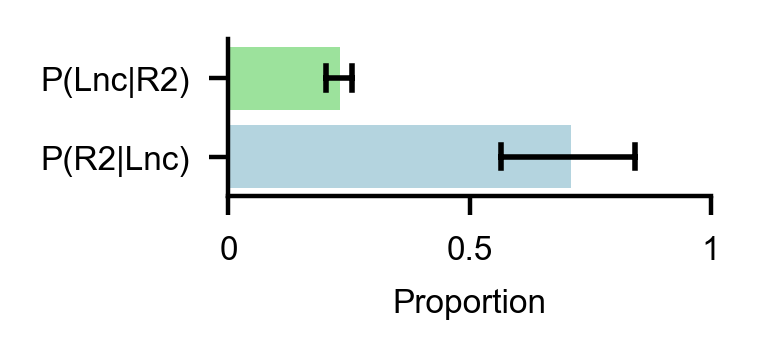

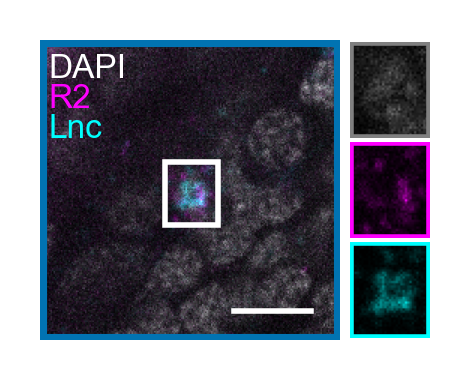

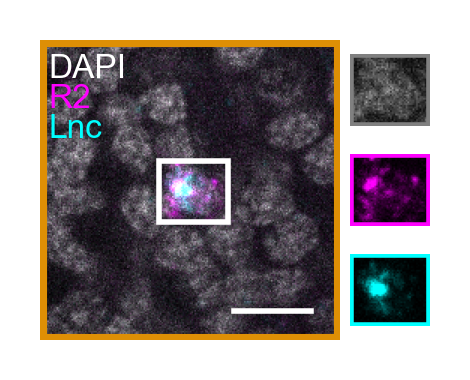

In [6]:
# R2-b3-488 Q1-b1-546 Lnc6-b2-647
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1_thresh=0.3, c2_thresh=0.3,
                c1="AF488", c2="AF647", 
                c1_name="R2", c2_name="Lnc", 
                coordinates=[[0.4, 0.8], [0.8, 0.4]], 
                dapi_max=255, c1_max=255, c2_max=255)

## A1: 9E129-B3-488 & LOC105275104-B1-546 & 9E116-B2-647 & DAPI** 
- 9E129 stain failed

In [4]:
input = '20250328 4 P14 9E129-b3-488 LOC104-b1-546 9E116-b2-647 dapi'
results_dir = f'../results/{input}'
results_files = os.listdir(results_dir)
results_files = [f for f in results_files if f.endswith('.csv')]

# Load all results 
results = pd.DataFrame() 
for f in results_files:
    results_path = os.path.join(results_dir, f)
    results = pd.concat([results, pd.read_csv(results_path)], axis=0) 

results

,z_id,image,z,count,area,centroid_x,centroid_y,AF546-T1,AF488-T2,AF647-T3
0,2,20250328 4 KLF sample 4.czi,14,0,7.013944,1099.745257,947.273713,3.199187,13.069106,3.058266
1,3,20250328 4 KLF sample 4.czi,14,1,5.550329,1124.470890,964.113014,2.470890,13.969178,2.767123
2,4,20250328 4 KLF sample 4.czi,14,2,6.177593,1074.006154,978.569231,2.943077,15.524615,3.130769
3,5,20250328 4 KLF sample 4.czi,14,3,6.880888,1048.765193,995.912983,2.544199,13.534530,2.589779
4,6,20250328 4 KLF sample 4.czi,14,4,6.852376,995.224688,1001.862691,2.649098,15.066574,2.754508
...,...,...,...,...,...,...,...,...,...,...
26104,6,20250328 4 KLF sample 1.czi,80,26104,7.061464,1144.580081,604.755047,8.454913,21.107672,8.118439
26105,7,20250328 4 KLF sample 1.czi,80,26105,4.742490,1125.196393,640.114228,12.569138,22.825651,17.496994
26106,8,20250328 4 KLF sample 1.czi,80,26106,5.911481,991.773312,967.617363,13.008039,22.702572,14.728296
26107,9,20250328 4 KLF sample 1.czi,80,26107,6.234617,1058.408537,979.440549,10.205793,23.213415,12.730183


In [27]:
file_number = 0
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

Loaded ../raw-data/20250324 A1 stacks/20250324 A1 Stack 1.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'AF488-T2', 'DAPI-T3', 'AF647-T3']}
Image shape: (1, 100, 4, 2048, 2048)
Loaded ../results/20250324 A1 stacks/20250324 A1 Stack 1_rois.npy


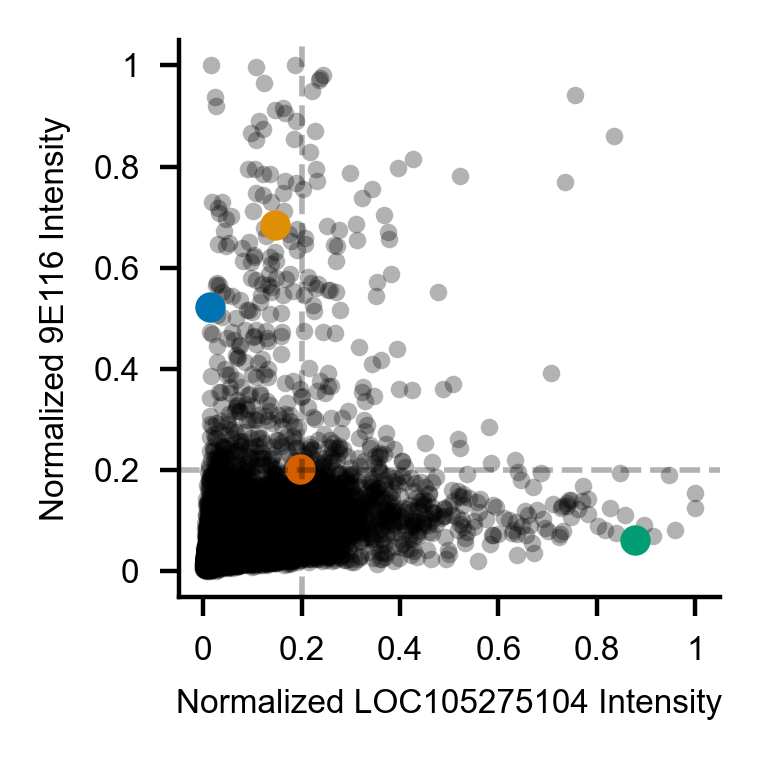

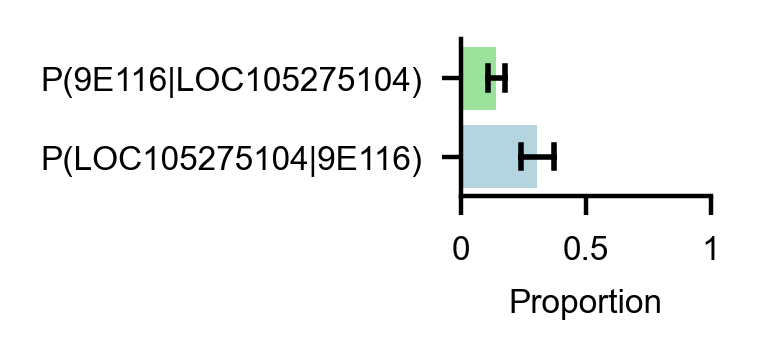

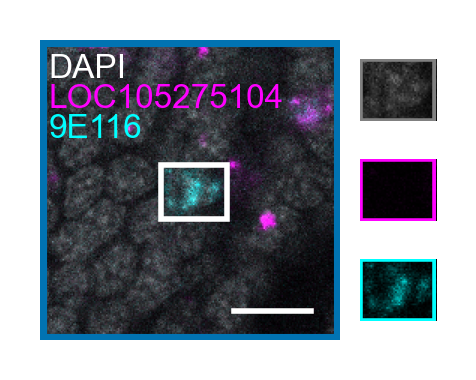

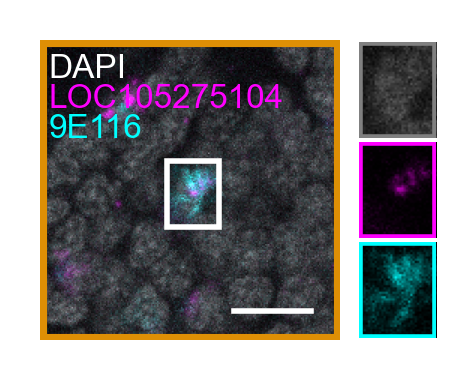

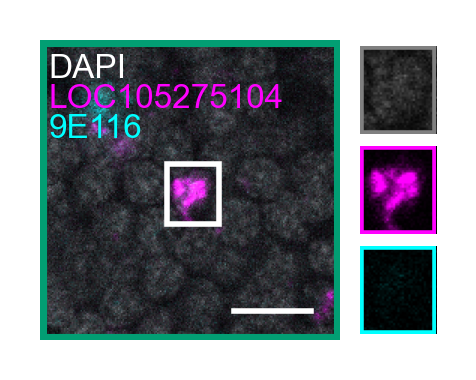

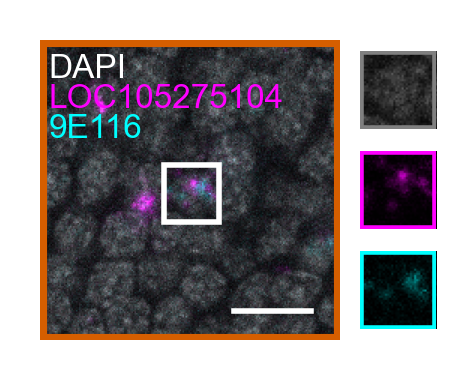

In [31]:
# A.1. 9E129-B3-488 & LOC105275104-B1-546 & 9E116-B2-647 & DAPI
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1_thresh=0.2, c2_thresh=0.2,
                c1="AF546", c2="AF647", 
                c1_name="LOC105275104", c2_name="9E116", 
                coordinates=[[0, 0.5], [0.2, 0.8], [0.8, 0], [0.2, 0.2]], 
                dapi_max=255, c1_max=255, c2_max=255)

## A2: LOC105282603-B3-488 & 9E108-B1-546 & 9E116-B2-647 & DAPI
- Start of LOC105282603 and end of 9E108 are 10kb away, 9E107 is nested in this space 
- LOC105282603-B3 (ZP, downstream of T45)

In [52]:
input = '20250324 A2 stacks'
results_dir = f'../results/{input}'
results_files = os.listdir(results_dir)
results_files = [f for f in results_files if f.endswith('.csv')]

# Load all results 
results = pd.DataFrame() 
for f in results_files:
    results_path = os.path.join(results_dir, f)
    results = pd.concat([results, pd.read_csv(results_path)], axis=0) 

results

,z_id,image,z,count,area,centroid_x,centroid_y,AF546-T1,AF488-T2,AF647-T3
0,1,20250324 A2 stack sample 2.czi,44,0,4.191259,1627.650794,710.396825,7.392290,24.088435,7.537415
1,4,20250324 A2 stack sample 2.czi,44,1,9.228373,1604.146241,744.926880,7.262616,19.762101,6.851699
2,5,20250324 A2 stack sample 2.czi,44,2,7.270551,1585.593464,777.256209,7.237908,19.058824,6.543791
3,6,20250324 A2 stack sample 2.czi,44,3,7.850295,1444.773608,810.409201,6.784504,18.220339,6.646489
4,7,20250324 A2 stack sample 2.czi,44,4,6.842872,1548.540278,860.552778,7.266667,17.918056,7.262500
...,...,...,...,...,...,...,...,...,...,...
30214,5,20250324 A2 stack sample 1.czi,103,30214,4.561915,937.414583,592.422917,6.445833,10.247917,5.381250
30215,6,20250324 A2 stack sample 1.czi,103,30215,5.170170,1170.113971,775.838235,5.834559,9.724265,5.461397
30216,7,20250324 A2 stack sample 1.czi,103,30216,5.407770,1105.516696,847.193322,5.455185,13.015817,6.267135
30217,8,20250324 A2 stack sample 1.czi,103,30217,6.253625,950.094225,986.861702,5.750760,10.303951,4.645897


In [43]:
file_number = 2
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

Loaded ../raw-data/20250324 A2 stacks/20250324 A2 stack sample 4.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'AF488-T2', 'DAPI-T3', 'AF647-T3']}
Image shape: (1, 138, 4, 2048, 2048)
Loaded ../results/20250324 A2 stacks/20250324 A2 stack sample 4_rois.npy


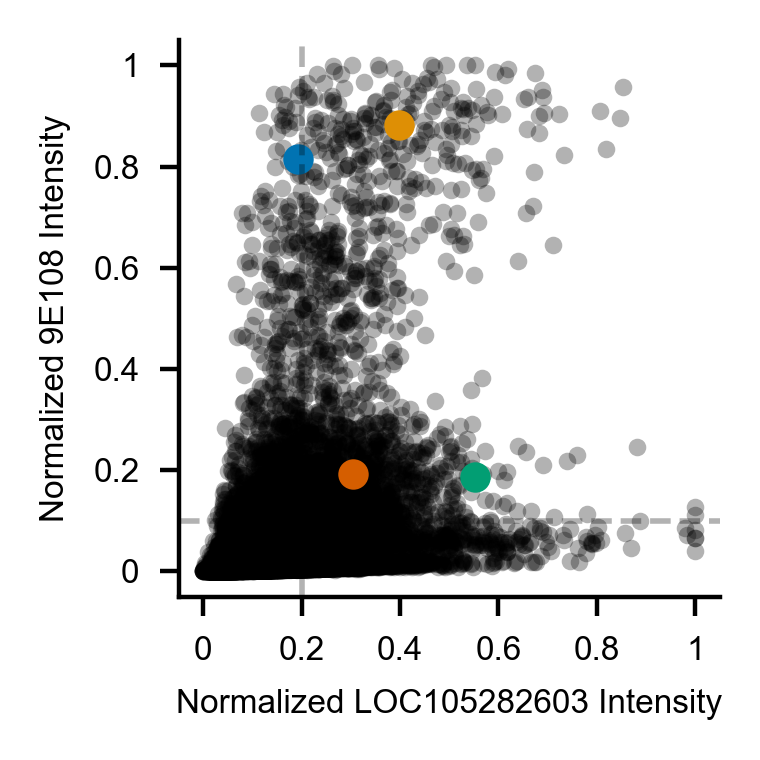

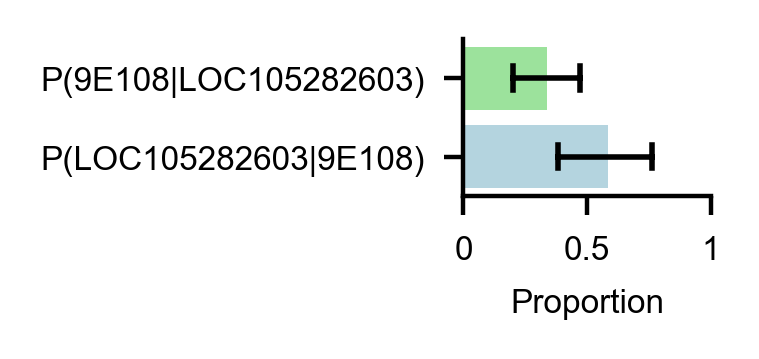

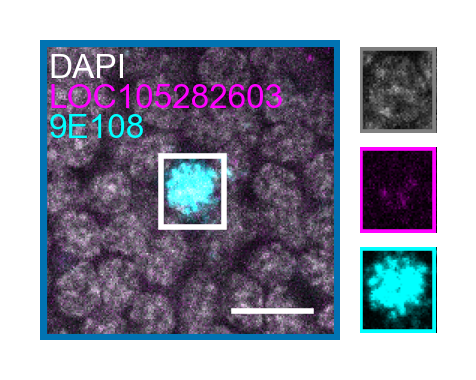

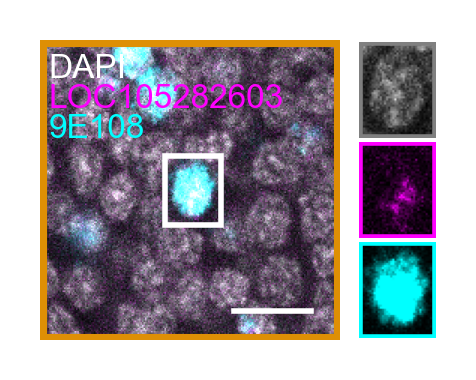

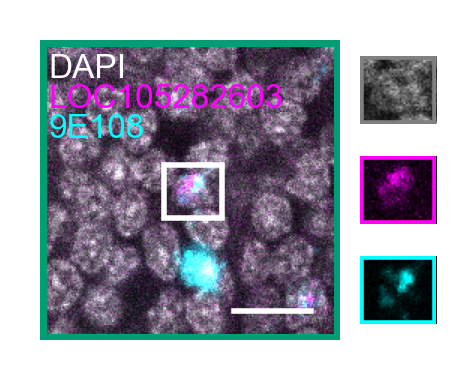

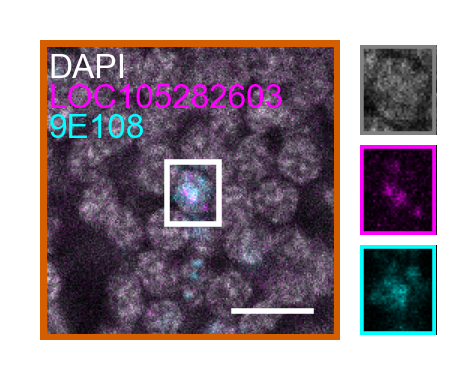

In [54]:
# A.2. LOC105282603-B3-488 & 9E108-B1-546 & 9E116-B2-647 & DAPI
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1_thresh=0.2, c2_thresh=0.1,
                c1="AF488", c2="AF546", 
                c1_name="LOC105282603", c2_name="9E108", 
                coordinates=[[0, 0.8], [0.4, 0.9], [0.6, 0.2], [0.3, 0.2]], 
                dapi_max=255, c1_max=100, c2_max=255)

## 9E198-B3-488 & 9E197-B1-546 & 9E196-B2-647 & DAPI

In [45]:
input = '20250325 6 9e198-b3-488 9e197-b1-546 9e196-b2-647 dapi'
results_dir = f'../results/{input}'
results_files = os.listdir(results_dir)
results_files = [f for f in results_files if f.endswith('.csv')]

# Load all results 
results = pd.DataFrame() 
for f in results_files:
    results_path = os.path.join(results_dir, f)
    results = pd.concat([results, pd.read_csv(results_path)], axis=0) 

results

,z_id,image,z,count,area,centroid_x,centroid_y,AF546-T1,AF488-T2,AF647-T3
0,1,20250325 5 t35 sample 4 great.czi,8,0,7.755255,635.649510,1543.416667,1.659314,11.813725,2.161765
1,2,20250325 5 t35 sample 4 great.czi,8,1,6.643288,683.509299,1587.805436,1.866953,10.776824,2.178827
2,1,20250325 5 t35 sample 4 great.czi,9,2,6.738328,638.978843,1544.925247,1.606488,9.894217,1.912553
3,2,20250325 5 t35 sample 4 great.czi,9,3,6.823864,593.323120,1640.267409,1.540390,9.032033,2.229805
4,1,20250325 5 t35 sample 4 great.czi,10,4,6.985432,784.170068,1268.906122,1.597279,9.923810,1.927891
...,...,...,...,...,...,...,...,...,...,...
30845,1,20250325 5 t35 sample 1 great.czi,84,30845,6.690808,668.596591,898.901989,1.488636,5.572443,1.882102
30846,2,20250325 5 t35 sample 1 great.czi,84,30846,8.648630,713.894505,928.036264,1.472527,6.165934,2.094505
30847,3,20250325 5 t35 sample 1 great.czi,84,30847,5.227194,668.918182,927.927273,1.709091,6.161818,1.676364
30848,4,20250325 5 t35 sample 1 great.czi,84,30848,5.141658,691.702403,951.445471,1.388170,5.959335,1.780037


In [47]:
file_number = 3
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

Loaded ../raw-data/20250325 6 9e198-b3-488 9e197-b1-546 9e196-b2-647 dapi/20250325 5 t35 sample 1 great.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'AF488-T2', 'DAPI-T3', 'AF647-T3']}
Image shape: (1, 102, 4, 2048, 2048)
Loaded ../results/20250325 6 9e198-b3-488 9e197-b1-546 9e196-b2-647 dapi/20250325 5 t35 sample 1 great_rois.npy


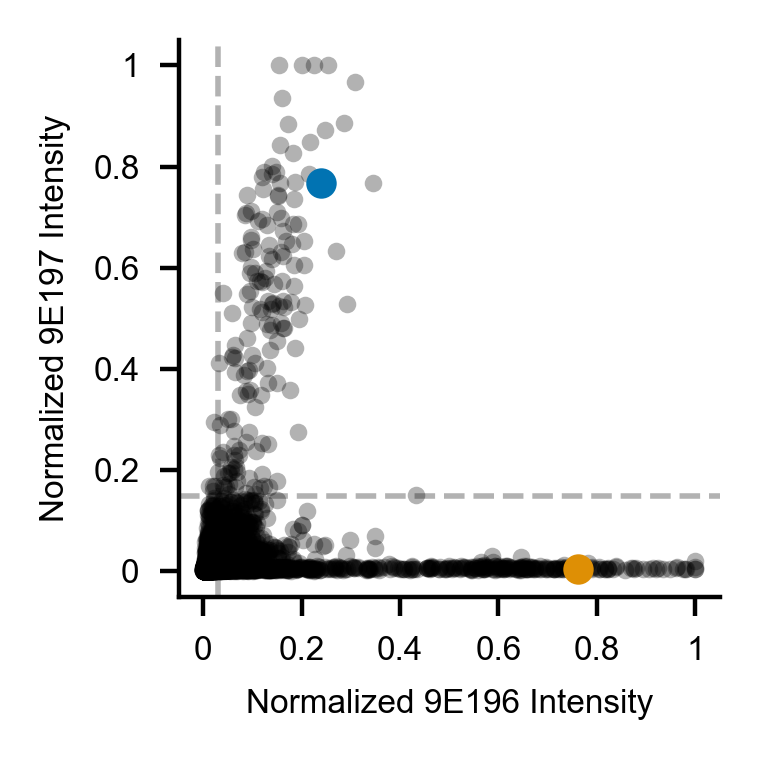

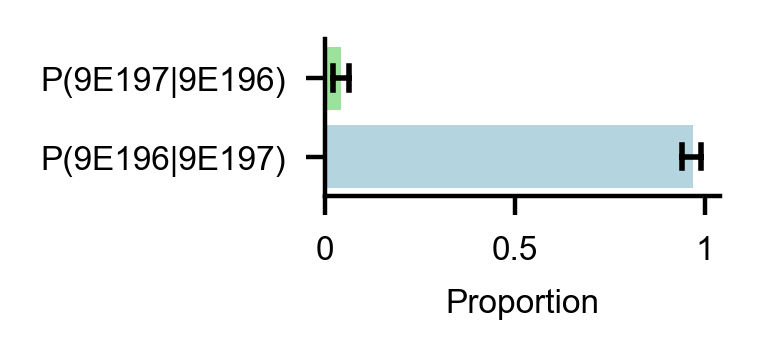

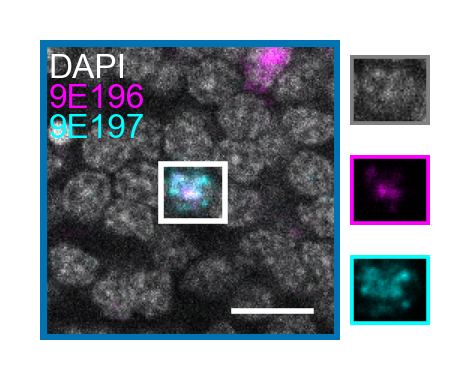

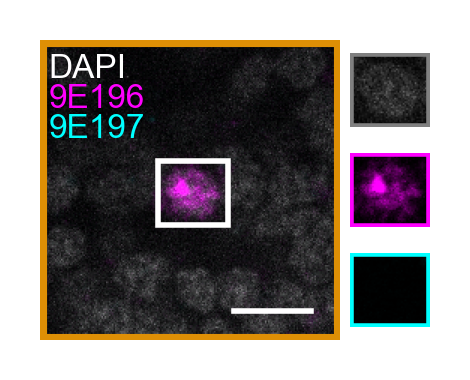

In [6]:
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1_thresh=0.03, c2_thresh=0.15,
                c1="AF647", c2="AF546", 
                c1_name="9E196", c2_name="9E197", 
                coordinates=[[0.3, 0.8], [0.8, 0]], 
                dapi_max=255, c1_max=255, c2_max=255)

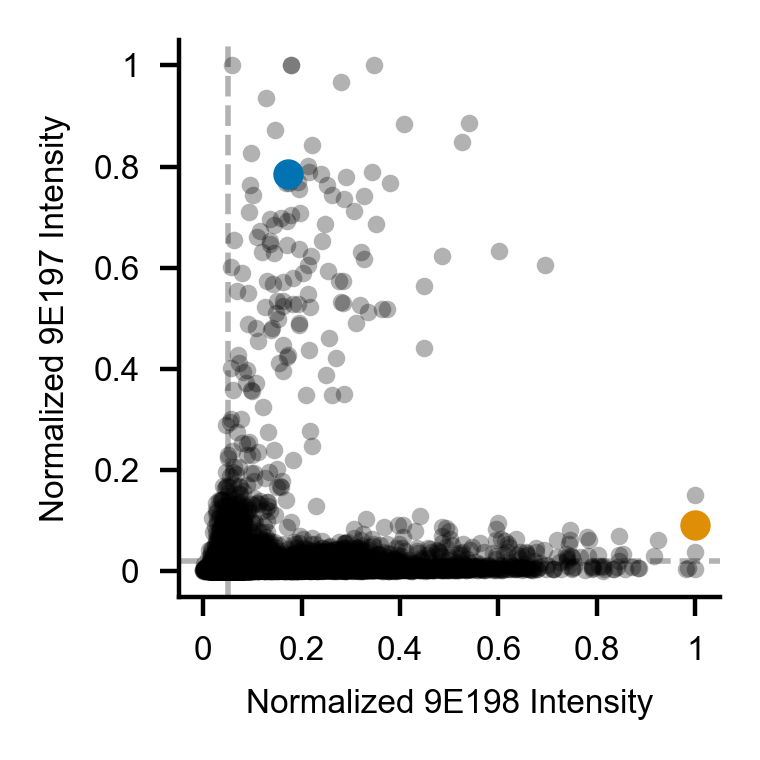

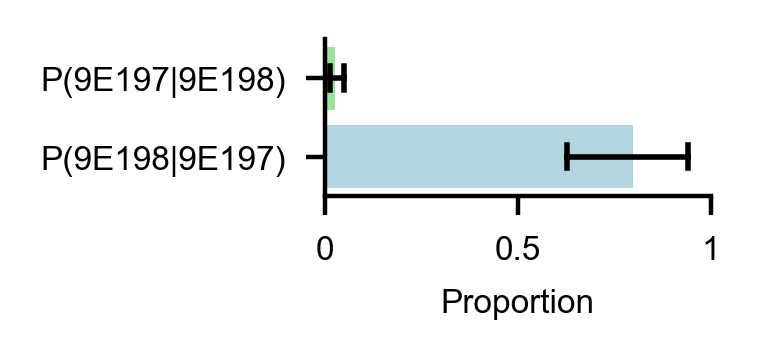

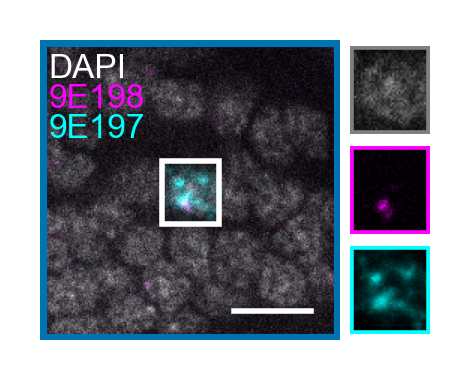

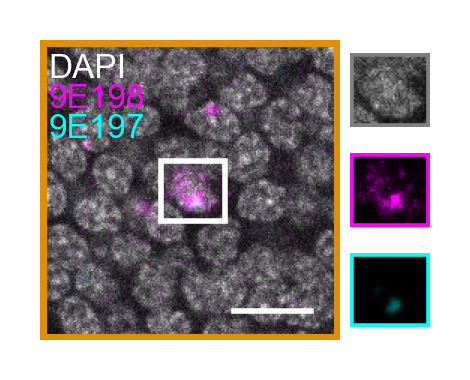

In [55]:
# 9e198-b3-488 9e197-b1-546 9e196-b2-647
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1_thresh=0.05, c2_thresh=0.02,
                c1="AF488", c2="AF546", 
                c1_name="9E198", c2_name="9E197", 
                coordinates=[[0.2, 0.8], [1, 0.2]], 
                dapi_max=255, c1_max=200, c2_max=255)

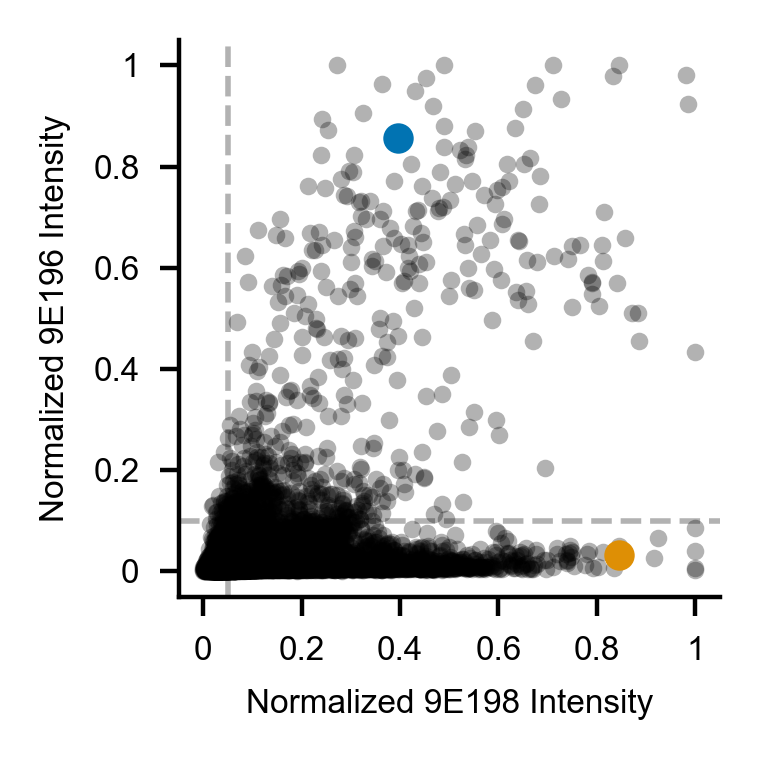

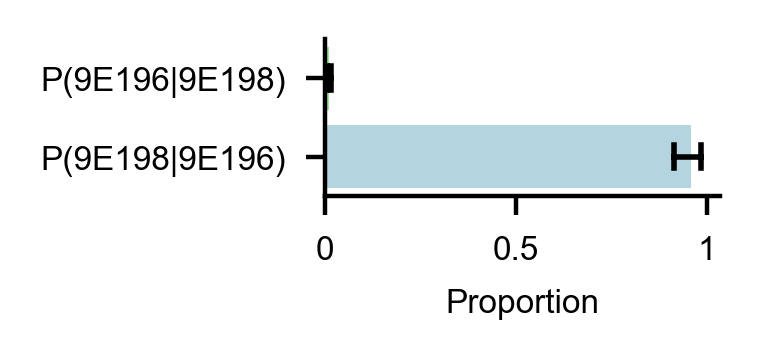

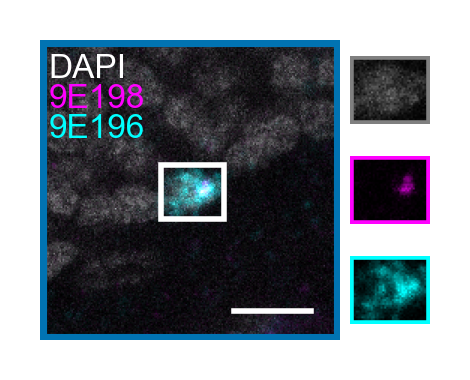

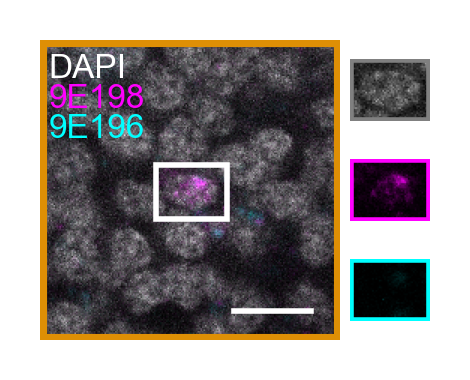

In [11]:
# 9e198-b3-488 9e197-b1-546 9e196-b2-647
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1_thresh=0.05, c2_thresh=0.1,
                c1="AF488", c2="AF647", 
                c1_name="9E198", c2_name="9E196", 
                coordinates=[[0.4, 0.8], [0.9, 0]], 
                dapi_max=255, c1_max=255, c2_max=255)

## U34-B3-488 & Lnc4-B1-546 & U21-B5-647 & DAPI 
- U21 is upstream of U34 
- Lnc4 is between U21 and U34 
- U21 and U34 coexpress 
- U34 and Lnc4 coexpress 
- U21 and Lnc4 do NOT coexpress 

In [39]:
input = '20250325 4 p14 u34-b3-488 lnc4-b1-546 u21-b5-647 dapi'
results_dir = f'../results/{input}'
results_files = os.listdir(results_dir)
results_files = [f for f in results_files if f.endswith('.csv')]

# Load all results 
results = pd.DataFrame() 
for f in results_files:
    results_path = os.path.join(results_dir, f)
    results = pd.concat([results, pd.read_csv(results_path)], axis=0) 

results

,z_id,image,z,count,area,centroid_x,centroid_y,AF546-T1,AF488-T2,AF647-T3
0,1,20250325 4 t19 lncrna sample 4 great.czi,2,0,8.819702,1039.184267,733.421336,1.631466,21.884698,3.643319
1,1,20250325 4 t19 lncrna sample 4 great.czi,4,1,6.168089,1005.258860,751.078582,1.879815,19.574730,3.112481
2,3,20250325 4 t19 lncrna sample 4 great.czi,4,2,5.730905,1054.633499,874.019900,1.761194,14.694859,3.354892
3,4,20250325 4 t19 lncrna sample 4 great.czi,4,3,6.101561,1085.733645,884.071651,1.280374,15.889408,2.359813
4,1,20250325 4 t19 lncrna sample 4 great.czi,5,4,4.409851,1005.676724,685.385776,1.989224,15.502155,3.306034
...,...,...,...,...,...,...,...,...,...,...
25937,13,20250325 4 t19 lncrna sample 3 great.czi,77,25937,6.187097,981.818740,1687.505376,1.310292,10.162826,2.339478
25938,1,20250325 4 t19 lncrna sample 3 great.czi,78,25938,6.063545,924.255486,1607.462382,1.369906,12.778997,2.043887
25939,2,20250325 4 t19 lncrna sample 3 great.czi,78,25939,6.538744,886.731105,1618.584302,1.456395,16.383721,2.609012
25940,3,20250325 4 t19 lncrna sample 3 great.czi,78,25940,8.458550,960.943820,1625.626966,1.422472,10.174157,2.228090


In [40]:
results[results["AF488-T2"] > 100]

,z_id,image,z,count,area,centroid_x,centroid_y,AF546-T1,AF488-T2,AF647-T3
21853,216,20250325 4 t19 lncrna sample 4 great.czi,56,21853,5.113146,1129.951673,923.163569,5.358736,157.868030,22.960967
21856,219,20250325 4 t19 lncrna sample 4 great.czi,56,21856,4.552411,1161.246347,923.822547,5.062630,146.210856,21.567850
14277,56,20250325 4 t19 lncrna sample 1 great.czi,39,14277,6.329657,1942.018018,562.217718,5.516517,180.276276,11.713213
14654,3,20250325 4 t19 lncrna sample 2 great.czi,45,14654,4.999098,1426.697719,198.838403,4.127376,131.500000,13.429658


In [41]:
results = results[results["AF488-T2"] < 100]

In [42]:
file_number = 1
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

Loaded ../raw-data/20250325 4 p14 u34-b3-488 lnc4-b1-546 u21-b5-647 dapi/20250325 4 t19 lncrna sample 1 great.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 26375.000076293945, 26511.386352539062), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'AF488-T2', 'DAPI-T3', 'AF647-T3']}
Image shape: (1, 78, 4, 2048, 2048)
Loaded ../results/20250325 4 p14 u34-b3-488 lnc4-b1-546 u21-b5-647 dapi/20250325 4 t19 lncrna sample 1 great_rois.npy


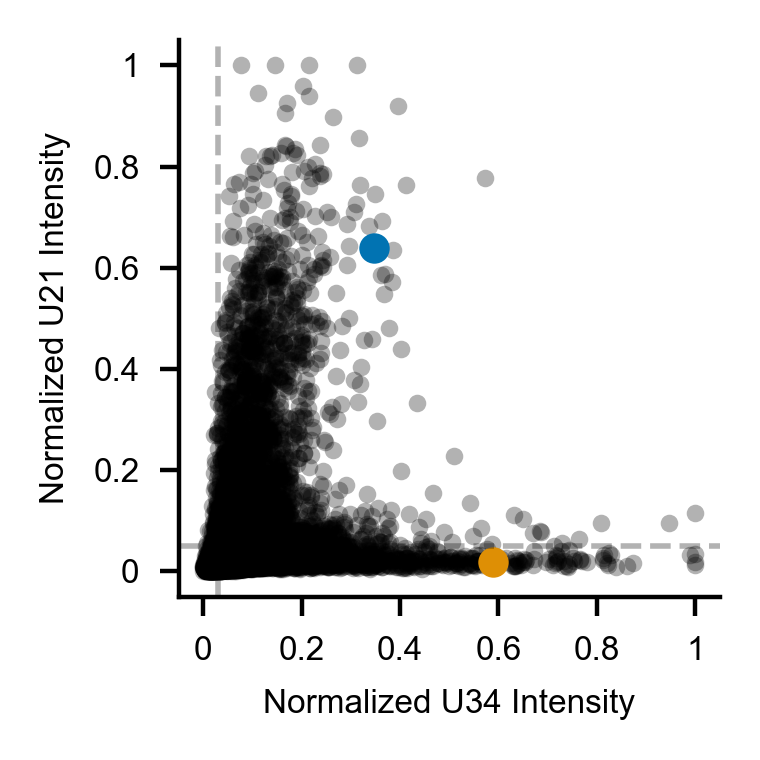

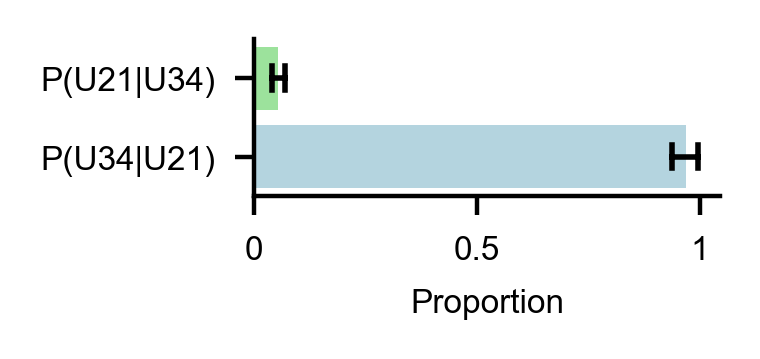

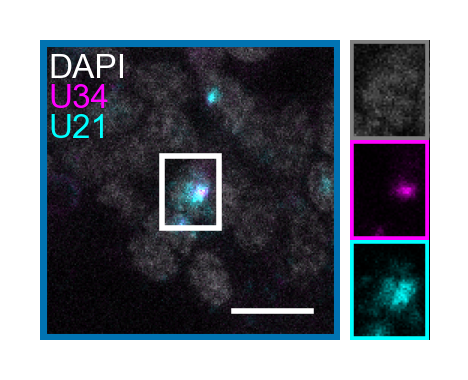

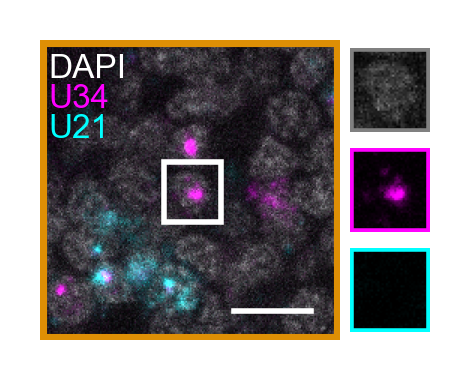

In [43]:
input = '20250325 4 p14 u34-b3-488 lnc4-b1-546 u21-b5-647 dapi'
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1_thresh=0.03, c2_thresh=0.05,
                c1="AF488", c2="AF647", 
                c1_name="U34", c2_name="U21", 
                coordinates=[[0.4, 0.8], [0.6, 0]], 
                dapi_max=200, c1_max=255, c2_max=200)

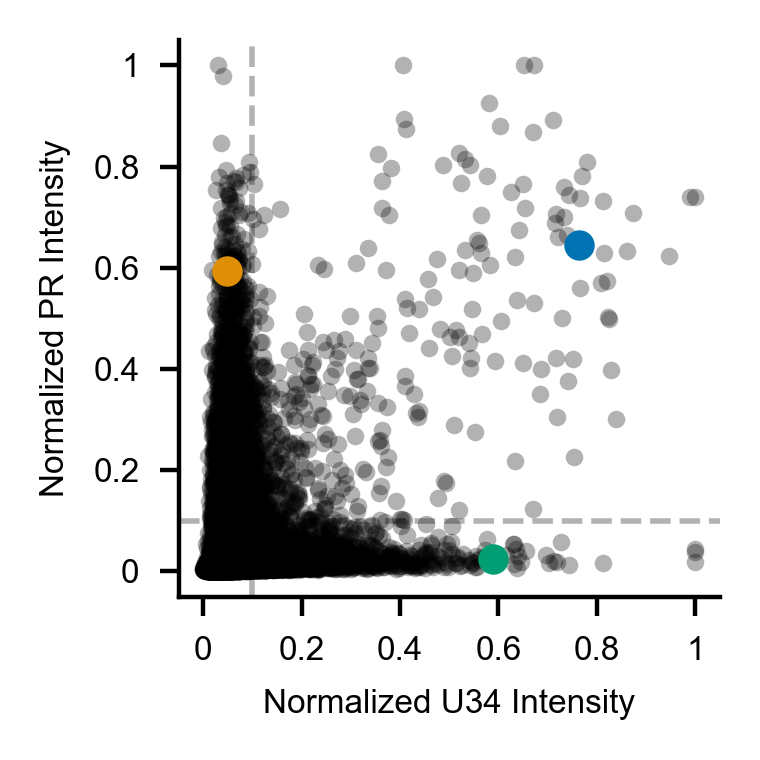

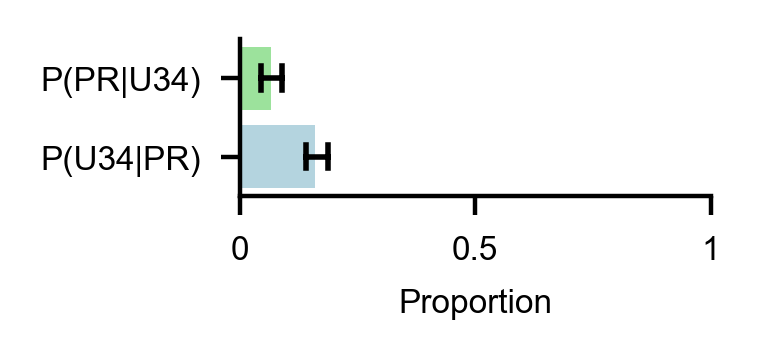

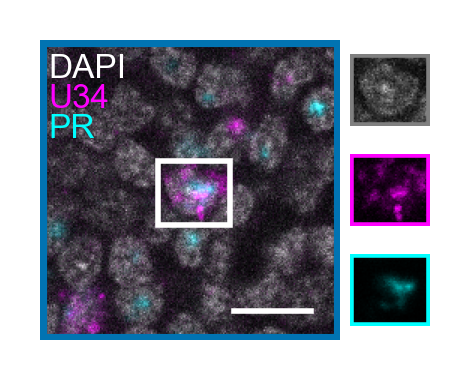

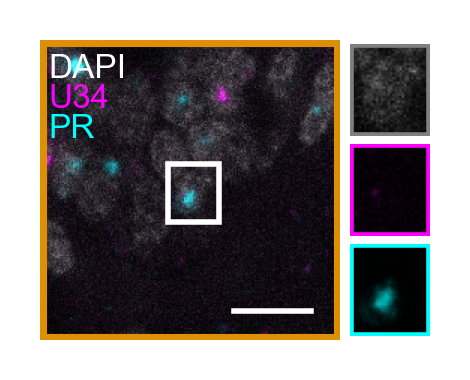

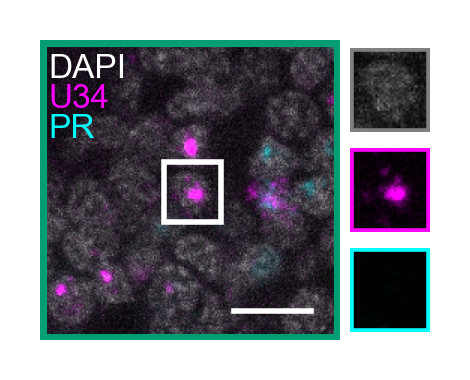

In [44]:
input = '20250325 4 p14 u34-b3-488 lnc4-b1-546 u21-b5-647 dapi'
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1_thresh=0.1, c2_thresh=0.1,
                c1="AF488", c2="AF546", 
                c1_name="U34", c2_name="PR", 
                coordinates=[[0.8, 0.6], [0.05, 0.6], [0.6, 0]], 
                dapi_max=200, c1_max=200, c2_max=255)

## A1: 9E129-B3-488 & LOC105275104-B1-546 & 9E116-B2-647 & DAPI** 

In [80]:
input = '20250324 A1 stacks'
file_number = 1
input_dir = f'../raw-data/{input}/'
assert os.path.exists(input_dir), 'Input directory does not exist'
czi_files = [f for f in os.listdir(input_dir) if f.endswith('.czi')]
print(f"Found {len(czi_files)} czi files in {input_dir}")
print(czi_files)
# Load single results file  
results_dir = f'../results/{input}'
file = czi_files[file_number]

# Load results 
results = pd.read_csv(os.path.join(results_dir, file.replace('.czi', '.csv')))
print(f"Loaded results for {file}")

# Load image 
file_path = os.path.join(input_dir, file)
reader = napari_get_reader(file_path)
if reader is not None:
    layer_data = reader(file_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {file_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = os.path.join(results_dir, file.replace('.czi', '_rois.npy'))
all_rois = np.load(all_rois_path)
print(f"Loaded ROIs for {file}")

Found 3 czi files in ../raw-data/20250324 A1 stacks/
['20250324 A1 Stack 3.czi', '20250324 A1 Stack 1.czi', '20250324 A1 Stack 2 BAD.czi']
Loaded results for 20250324 A1 Stack 1.czi
Loaded ../raw-data/20250324 A1 stacks/20250324 A1 Stack 1.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'AF488-T2', 'DAPI-T3', 'AF647-T3']}
Image shape: (1, 100, 4, 2048, 2048)
Loaded ROIs for 20250324 A1 Stack 1.czi


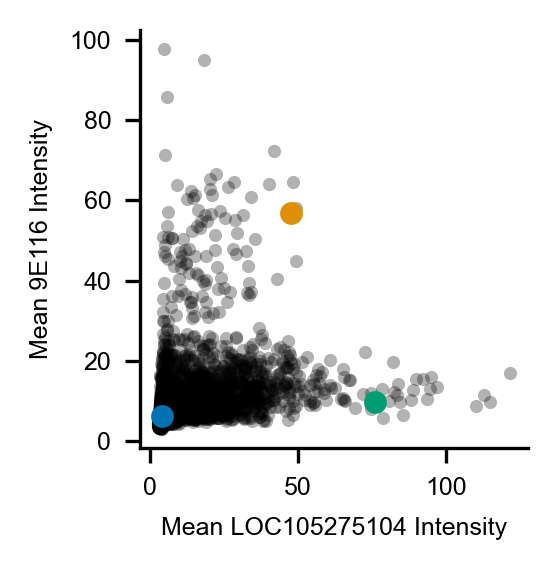

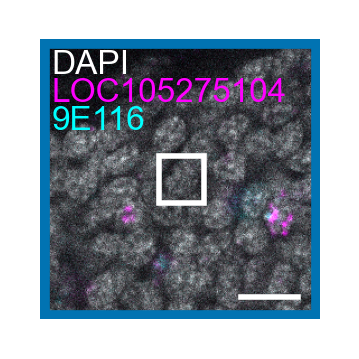

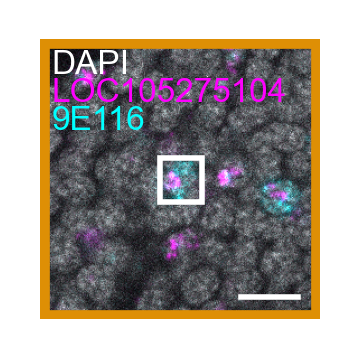

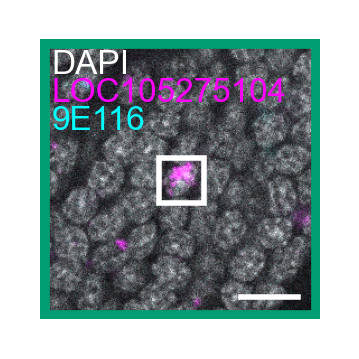

In [81]:
plot_2_channels(results=results, 
                c1="AF546", c2="AF647", 
                c1_name="LOC105275104", c2_name="9E116", 
                n_bins=2, pixel_bounds=125, 
                min_area=5, seed=6, bbox_expansion=5, 
                dapi_max=150, c1_max=255, c2_max=255, 
                image=image_data, metadata=metadata, all_rois=all_rois, input=input, file=file)

## A2: LOC105282603-B3-488 & 9E108-B1-546 & 9E116-B2-647 & DAPI

In [5]:
input = '20250324 A2 stacks'
file_number = 2
input_dir = f'../raw-data/{input}/'
assert os.path.exists(input_dir), 'Input directory does not exist'
czi_files = [f for f in os.listdir(input_dir) if f.endswith('.czi')]
print(f"Found {len(czi_files)} czi files in {input_dir}")
print(czi_files)
# Load single results file  
results_dir = f'../results/{input}'
file = czi_files[file_number]

# Load results 
results = pd.read_csv(os.path.join(results_dir, file.replace('.czi', '.csv')))
print(f"Loaded results for {file}")

# Load image 
file_path = os.path.join(input_dir, file)
reader = napari_get_reader(file_path)
if reader is not None:
    layer_data = reader(file_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {file_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = os.path.join(results_dir, file.replace('.czi', '_rois.npy'))
all_rois = np.load(all_rois_path)
print(f"Loaded ROIs for {file}")

Found 6 czi files in ../raw-data/20250324 A2 stacks/
['20250324 A2 stack sample 4.czi', '20250324 A2 stack sample 3.czi', '20250324 A2 stack sample 2.czi', '20250324 A2 stack sample 5.czi', '20250324 A2 stack sample 6.czi', '20250324 A2 stack sample 1.czi']
Loaded results for 20250324 A2 stack sample 2.czi
Loaded ../raw-data/20250324 A2 stacks/20250324 A2 stack sample 2.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'AF488-T2', 'DAPI-T3', 'AF647-T3']}
Image shape: (1, 138, 4, 2048, 2048)
Loaded ROIs for 20250324 A2 stack sample 2.czi


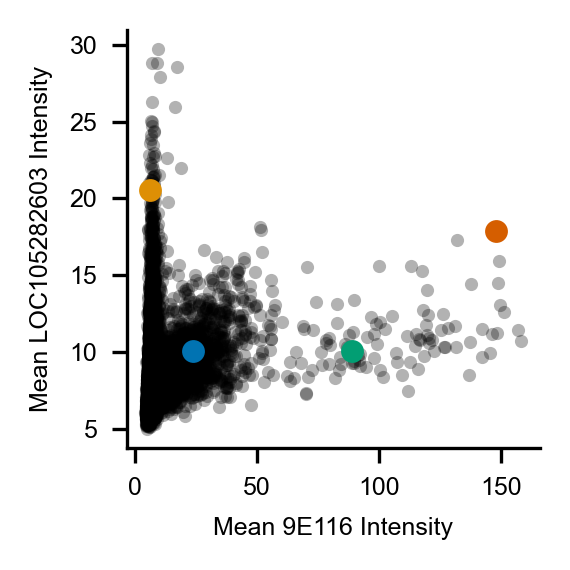

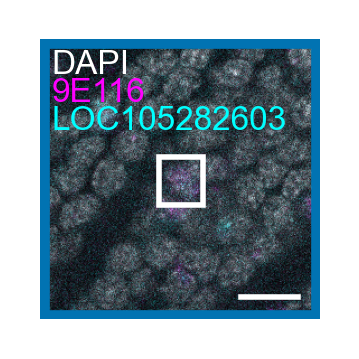

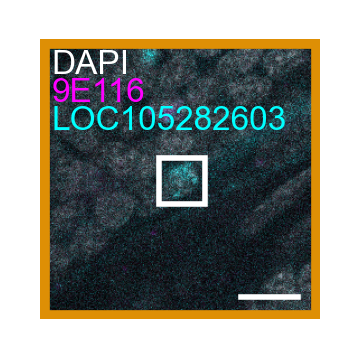

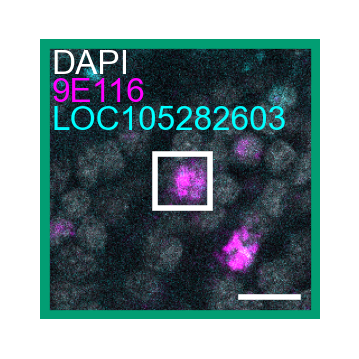

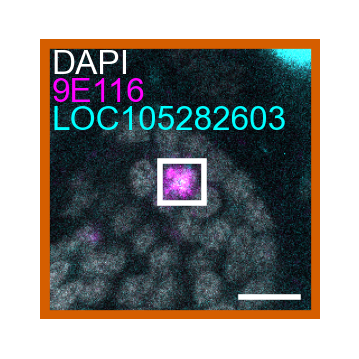

In [6]:
plot_2_channels(results=results, 
                c1="AF647", c2="AF488", 
                c1_name="9E116", c2_name="LOC105282603", 
                n_bins=2, pixel_bounds=125, 
                min_area=0, seed=1, bbox_expansion=5, 
                dapi_max=255, c1_max=255, c2_max=100, 
                image=image_data, metadata=metadata, all_rois=all_rois, input=input, file=file)

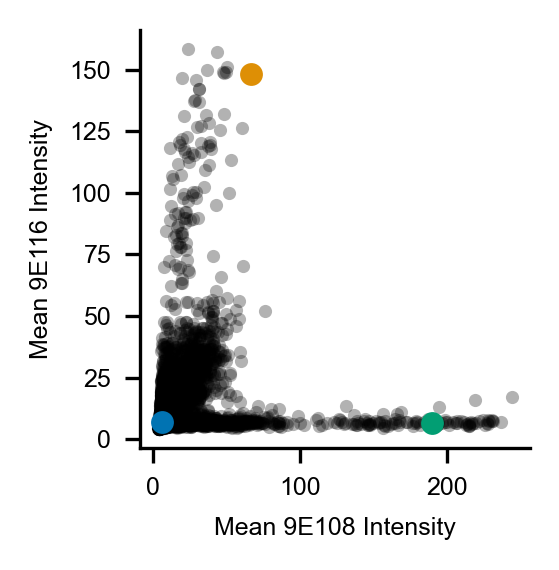

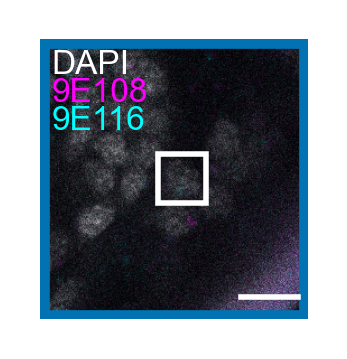

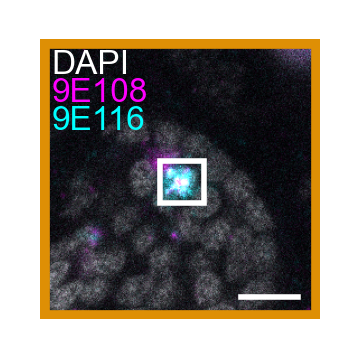

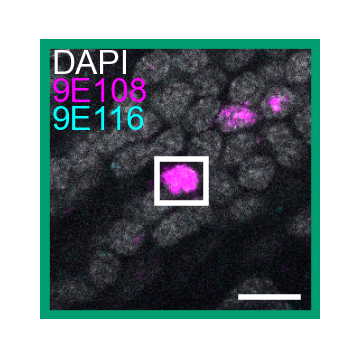

In [7]:
plot_2_channels(results=results, 
                c1="AF546", c2="AF647", 
                c1_name="9E108", c2_name="9E116", 
                n_bins=2, pixel_bounds=125, 
                min_area=5, seed=6, bbox_expansion=5, 
                dapi_max=255, c1_max=255, c2_max=255, 
                image=image_data, metadata=metadata, all_rois=all_rois, input=input, file=file)

## B1: U34 & Chymotrypsin 

In [82]:
input = '20250307 B1 stacks'
file_number = 0 
input_dir = f'../raw-data/{input}/'
assert os.path.exists(input_dir), 'Input directory does not exist'
czi_files = [f for f in os.listdir(input_dir) if f.endswith('.czi')]
print(f"Found {len(czi_files)} czi files in {input_dir}")
print(czi_files)
# Load single results file  
results_dir = f'../results/{input}'
file = czi_files[file_number]

# Load results 
results = pd.read_csv(os.path.join(results_dir, file.replace('.czi', '.csv')))
print(f"Loaded results for {file}")

# Load image 
file_path = os.path.join(input_dir, file)
reader = napari_get_reader(file_path)
if reader is not None:
    layer_data = reader(file_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {file_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = os.path.join(results_dir, file.replace('.czi', '_rois.npy'))
all_rois = np.load(all_rois_path)
print(f"Loaded ROIs for {file}")

Found 5 czi files in ../raw-data/20250307 B1 stacks/
['20250307 B1 Sample 5 Stack.czi', '20250307 B1 Sample 4 Stack.czi', '20250307 B1 Sample 1 Stack.czi', '20250307 B1 Sample 3 Stack.czi', '20250307 B1 Sample 2 Stack.czi']
Loaded results for 20250307 B1 Sample 5 Stack.czi
Loaded ../raw-data/20250307 B1 stacks/20250307 B1 Sample 5 Stack.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 0.5, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'DAPI-T2', 'AF647-T2']}
Image shape: (1, 202, 3, 2048, 2048)
Loaded ROIs for 20250307 B1 Sample 5 Stack.czi


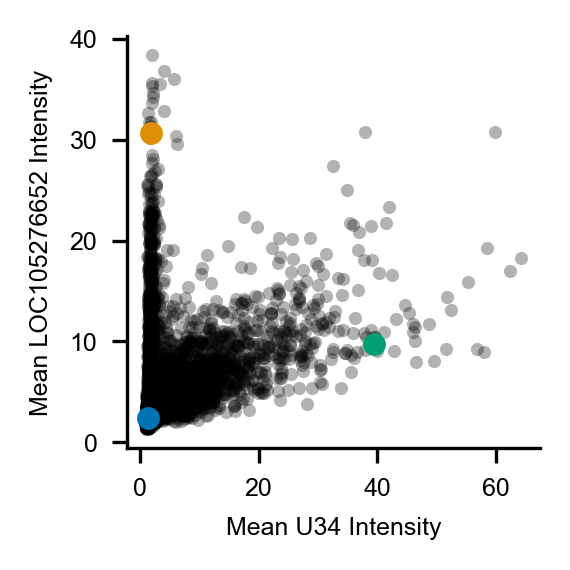

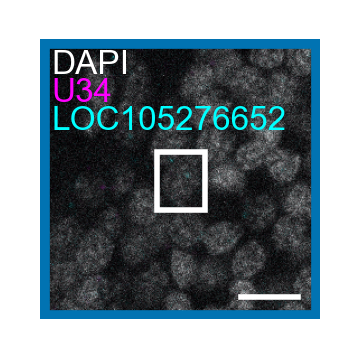

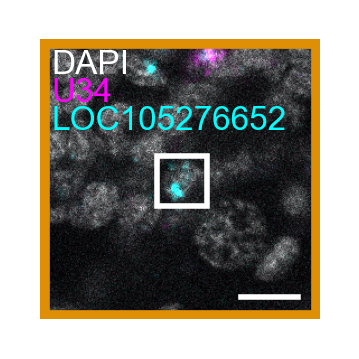

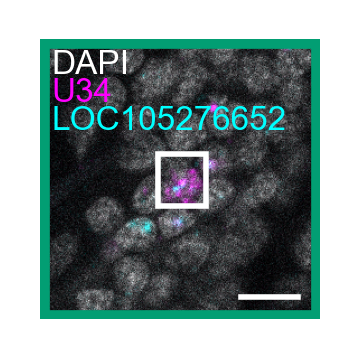

In [83]:
plot_2_channels(results=results, 
                c1="AF546", c2="AF647", 
                c1_name="U34", c2_name="LOC105276652", 
                n_bins=2, pixel_bounds=125, 
                min_area=8, seed=3, bbox_expansion=5, 
                dapi_max=200, c1_max=200, c2_max=200, 
                image=image_data, metadata=metadata, all_rois=all_rois, input=input, file=file)

## C2: 9E306 & 9E196

In [84]:
input = '20250307 C2 stacks'
file_number = 1 
input_dir = f'../raw-data/{input}/'
assert os.path.exists(input_dir), 'Input directory does not exist'
czi_files = [f for f in os.listdir(input_dir) if f.endswith('.czi')]
print(f"Found {len(czi_files)} czi files in {input_dir}")
print(czi_files)
# Load single results file  
results_dir = f'../results/{input}'
file = czi_files[file_number]

# Load results 
results = pd.read_csv(os.path.join(results_dir, file.replace('.czi', '.csv')))
print(f"Loaded results for {file}")

# Load image 
file_path = os.path.join(input_dir, file)
reader = napari_get_reader(file_path)
if reader is not None:
    layer_data = reader(file_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {file_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = os.path.join(results_dir, file.replace('.czi', '_rois.npy'))
all_rois = np.load(all_rois_path)
print(f"Loaded ROIs for {file}")

Found 4 czi files in ../raw-data/20250307 C2 stacks/
['20250307 C2 sample 1 stack.czi', '20250307 C2 sample 2 stack.czi', '20250307 C2 sample 3 stack.czi', '20250307 C2 sample 4 stack.czi']
Loaded results for 20250307 C2 sample 2 stack.czi
Loaded ../raw-data/20250307 C2 stacks/20250307 C2 sample 2 stack.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 27637.767364501953, 31444.592025756836), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'AF488-T2', 'DAPI-T3', 'AF647-T3']}
Image shape: (1, 87, 4, 2048, 2048)
Loaded ROIs for 20250307 C2 sample 2 stack.czi


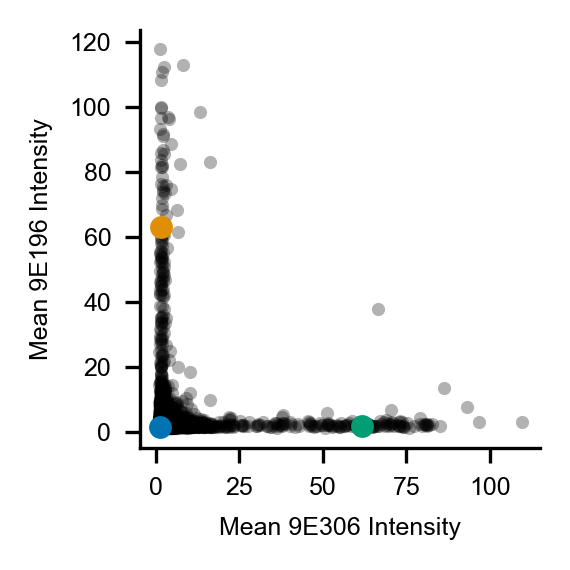

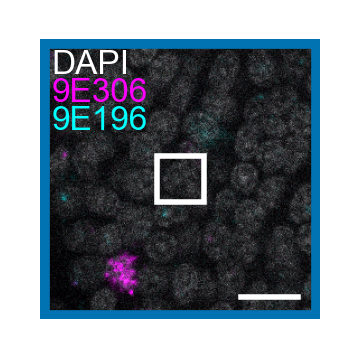

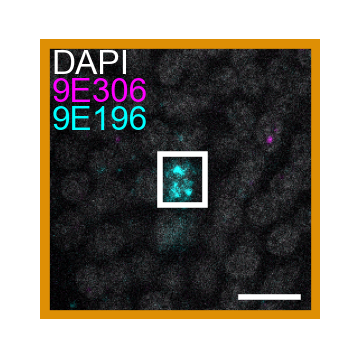

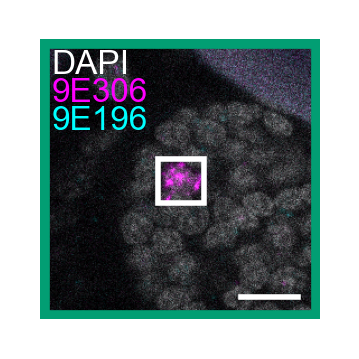

In [85]:
plot_2_channels(results=results, 
                c1="AF546", c2="AF647", 
                c1_name="9E306", c2_name="9E196", 
                n_bins=2, pixel_bounds=125, 
                min_area=6, seed=1, bbox_expansion=5, 
                dapi_max=200, c1_max=200, c2_max=200, 
                image=image_data, metadata=metadata, all_rois=all_rois, input=input, file=file)

## Code Archive

In [ ]:
def plot_2_channels_threshold(results, c1, c2, c1_name, c2_name, coordinates, image, metadata, all_rois, input, file, 
                    c1_thresh=0.1, c2_thresh=0.1, pixel_bounds=100, bbox_expansion=5, 
                    dapi_max=255, c1_max=255, c2_max=255): 
    
    # Remove -T from column names
    results.columns = results.columns.str.split('-T').str[0]

    # Make figure directory
    figure_dir = f'../figures/model_B_only_OSNs/{input}/{file.replace(".czi", "")}-{c1_name}-{c2_name}'
    if not os.path.exists(figure_dir):
        os.makedirs(figure_dir)

    # Clear directory
    for f in os.listdir(figure_dir):
        os.remove(os.path.join(figure_dir, f))
    
    # Normalize intensities for each sample using robust quantile-based normalization 
    # This approach "clips" extreme values without discarding them entirely
    for sample in results['image'].unique():
        results_sample = results[results['image'] == sample]
        for channel in [c1, c2]: 
            lower = results_sample[channel].quantile(0.01)
            upper = results_sample[channel].quantile(0.99)
            results_sample[channel] = (results_sample[channel] - lower) / (upper - lower)
            #results_sample[channel] = (results_sample[channel] - results_sample[channel].min()) / (results_sample[channel].max() - results_sample[channel].min())
        results.loc[results['image'] == sample] = results_sample
        

    # Scatter Plot 
    f, ax = plt.subplots(1, 1, figsize=(2, 2), dpi = 400) 
    sns.scatterplot(data=results, x=c1, y=c2, s=10, ax=ax, color='black', alpha=0.3, lw=0)

    # Plot coordinates using the data from the image 
    results_image = results[results['image'] == file].reset_index(drop=True)
    random_colors = sns.color_palette('colorblind', len(coordinates))
    cells = [] 
    for i, coord in enumerate(coordinates): 
        cell_idx = np.argmin(np.linalg.norm(results_image[[c1, c2]].values - coord, axis=1))
        cell = results_image.iloc[cell_idx].copy()  
        sns.scatterplot(data=pd.DataFrame([cell]), x=c1, y=c2, color=random_colors[i], s=30, ax=ax, lw=0, alpha=1)
        cell["color"] = random_colors[i] 
        cell["number"] = i + 1
        cells.append(cell)
    cells = pd.DataFrame(cells)

    # Plotting 
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_xlabel(f"Normalized {c1_name} Intensity", fontsize=6) 
    ax.set_ylabel(f"Normalized {c2_name} Intensity", fontsize=6)
    ax.tick_params(axis='both', which='major', labelsize=6)

    #ax.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1], labels=[0, 0.2, 0.4, 0.6, 0.8, 1], fontsize=6)
    #ax.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1], labels=[0, 0.2, 0.4, 0.6, 0.8, 1], fontsize=6)
    
    # Plot threshold as dotted lines 
    #ax.axvline(c1_thresh, color='black', linestyle='--', lw=1, alpha=0.3)
    #ax.axhline(c2_thresh, color='black', linestyle='--', lw=1, alpha=0.3)

    plt.tight_layout()
    plt.savefig(f"{figure_dir}/{file.replace('.czi', '')}-{c1_name}-{c2_name}-scatter.png", format="png", pad_inches=0, bbox_inches=0, transparent=False)
    plt.show()

    # Plot a bar graph 
    """f, ax = plt.subplots(1, 1, figsize=(2, 1), dpi = 400)
    # Calculate the proportion of c1 cells > c1_thresh that express c2 > c2_thresh and vice versa
    results['c1_thresh'] = results[c1] > c1_thresh
    results['c2_thresh'] = results[c2] > c2_thresh
    prop_c1_also_c2 = []
    prop_c2_also_c1 = []
    for sample in results['image'].unique():
        sample_results = results[results['image'] == sample]
        prop_c1_also_c2.append(sample_results[(sample_results['c1_thresh'] == True) & (sample_results['c2_thresh'] == True)].shape[0] / sample_results[sample_results['c1_thresh'] == True].shape[0])
        prop_c2_also_c1.append(sample_results[(sample_results['c1_thresh'] == True) & (sample_results['c2_thresh'] == True)].shape[0] / sample_results[sample_results['c2_thresh'] == True].shape[0])
    prop_results = pd.DataFrame({'c1_also_c2': prop_c1_also_c2, 'c2_also_c1': prop_c2_also_c1})
    prop_results = prop_results.melt(value_vars=['c1_also_c2', 'c2_also_c1'], var_name='condition', value_name='proportion')
    # horizontal barplot with error bars for 95% CI 
    sns.barplot(data=prop_results, x="proportion", y="condition", orient='h', ax=ax, palette=['lightgreen', 'lightblue'], 
                alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_xlabel(f"Proportion", fontsize=6) 
    ax.set_ylabel("")
    ax.set_yticks([0, 1], labels=[f'P({c2_name}|{c1_name})', f'P({c1_name}|{c2_name})'], fontsize=6)
    ax.set_xticks([0, 0.5, 1], labels=[0, 0.5, 1], fontsize=6)

    plt.tight_layout()
    plt.savefig(f"{figure_dir}/{file.replace('.czi', '')}-{c1_name}-{c2_name}-bar.png", format="png", pad_inches=0, bbox_inches=0, transparent=False)
    plt.show()"""

    channels = [(i, metadata['name'][i]) for i in range(len(metadata['name']))]
    channels = [(i, channel) for i, channel in channels if any([name in channel for name in ["DAPI", c1, c2]])]

    # Get scale for scale bar 
    x_scale_5 = 5 / metadata['scale'][2] # 5 um in pixels 

    def set_min_max(channel, min_val, max_val):
        if min_val == max_val:
            return np.zeros_like(channel)  # If min == max, return all zeros
        clipped = np.clip(channel, min_val, max_val)
        rescaled = (clipped - min_val) / (max_val - min_val) * 255
        return np.clip(rescaled, 0, 255)  # Ensure the values remain in the [0, 255] range

    for i, cell in cells.iterrows():
        # Retrieve image and z slice 
        x_bounds = int(cell['centroid_x']) - pixel_bounds, int(cell['centroid_x']) + pixel_bounds 
        y_bounds = int(cell['centroid_y']) - pixel_bounds, int(cell['centroid_y']) + pixel_bounds 
        cell_image = image[0, cell['z'], :, y_bounds[0]:y_bounds[1], x_bounds[0]:x_bounds[1]]  # shape: (channels, H, W)

        # Create composite RGB image
        rgb_image = np.zeros((cell_image.shape[1], cell_image.shape[2], 3), dtype=float)  # (H, W, 3)

        # -- DAPI (Grey): add to all channels
        dapi = [idx for idx, channel in channels if 'DAPI' in channel][0]
        dapi_adjusted = set_min_max(cell_image[dapi], 0, dapi_max)
        rgb_image[..., 0] += dapi_adjusted  # Red
        rgb_image[..., 1] += dapi_adjusted  # Green
        rgb_image[..., 2] += dapi_adjusted  # Blue

        # -- Magenta (c1): add to red and blue
        c1_index = [idx for idx, channel in channels if c1 in channel][0]
        c1_adjusted = set_min_max(cell_image[c1_index], 0, c1_max) 
        rgb_image[..., 0] += c1_adjusted  # Red
        rgb_image[..., 2] += c1_adjusted  # Blue

        # -- Cyan (c2): add to green and blue
        c2_index = [idx for idx, channel in channels if c2 in channel][0]
        c2_adjusted = set_min_max(cell_image[c2_index], 0, c2_max)
        rgb_image[..., 1] += c2_adjusted  # Green
        rgb_image[..., 2] += c2_adjusted  # Blue

        # Normalize composite image to [0,1]
        rgb_image = np.clip(rgb_image/255, 0, 1)

        # Load ROIs and compute bbox (adjusted relative to the cell image)
        regions = regionprops(all_rois[cell['z'], :, :])
        region_labels = [region.label for region in regions]
        region = regions[region_labels.index(cell['z_id'])]
        bbox = region.bbox
        # Expand bbox by bbox_expansion pixels     
        bbox = (bbox[0] - bbox_expansion, bbox[1] - bbox_expansion, 
                bbox[2] + bbox_expansion, bbox[3] + bbox_expansion)
        # Adjust bbox to cell_image coordinates
        bbox = (bbox[0] - y_bounds[0], bbox[1] - x_bounds[0],
                bbox[2] - y_bounds[0], bbox[3] - x_bounds[0])
        # For clarity, unpack bbox (top, left, bottom, right)
        y1, x1, y2, x2 = bbox

        # Create figure with gridspec: main image in left column (spanning all rows) 
        # and three zoom panels in the right column (each taking 1/3 height)
        # Adjust fig size and width ratios as needed.
        fig_width = 1   # total width (main image + zoom panels)
        fig_height = 0.75  # height of the main image (zoom panels share this height)
        f = plt.figure(figsize=(fig_width, fig_height), dpi=400)
        gs = gridspec.GridSpec(nrows=3, ncols=2, width_ratios=[4, 1])
        ax_main = f.add_subplot(gs[:, 0])
        ax_zoom_gray = f.add_subplot(gs[0, 1])
        ax_zoom_magenta = f.add_subplot(gs[1, 1])
        ax_zoom_cyan = f.add_subplot(gs[2, 1])

        # Plot main composite image
        ax_main.imshow(rgb_image)
        ax_main.axis("off")
        # Add border to main image
        ax_main.add_patch(plt.Rectangle((0, 0), cell_image.shape[2]-1, cell_image.shape[1]-1, fill=False, edgecolor=cell['color'], lw=2))
        # Add text legends on main image
        ax_main.text(5, 25, "DAPI", color='white', fontsize=6) 
        ax_main.text(5, 45, c1_name, color='magenta', fontsize=6)
        ax_main.text(5, 65, c2_name, color='cyan', fontsize=6)
        # Add scale bar on main image
        ax_main.plot([2*pixel_bounds-20-x_scale_5, 2*pixel_bounds-20], 
                    [2*pixel_bounds-20, 2*pixel_bounds-20], color='white', lw=1)
        
        ax_main.add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, fill=False, edgecolor='white', lw=1))

        # ----- Create zoom panels -----
        # Zoom for Grey (DAPI)
        zoom_dapi = dapi_adjusted[y1:y2, x1:x2]
        # Build RGB image: all channels get the DAPI intensity
        dapi_zoom = np.zeros((zoom_dapi.shape[0], zoom_dapi.shape[1], 3), dtype=float)
        dapi_zoom[..., 0] = zoom_dapi
        dapi_zoom[..., 1] = zoom_dapi
        dapi_zoom[..., 2] = zoom_dapi
        dapi_zoom = np.clip(dapi_zoom/255, 0, 1)
        ax_zoom_gray.imshow(dapi_zoom)
        ax_zoom_gray.axis("off")
        ax_zoom_gray.add_patch(plt.Rectangle((0, 0), zoom_dapi.shape[1]-1, zoom_dapi.shape[0]-1, fill=False, edgecolor='grey', lw=1))

        # Zoom for Magenta (c1)
        zoom_c1 = c1_adjusted[y1:y2, x1:x2]
        # Build an RGB image: red and blue channels from c1
        magenta_zoom = np.zeros((zoom_c1.shape[0], zoom_c1.shape[1], 3), dtype=float)
        magenta_zoom[..., 0] = zoom_c1  # red
        magenta_zoom[..., 2] = zoom_c1  # blue
        magenta_zoom = np.clip(magenta_zoom/255, 0, 1)
        ax_zoom_magenta.imshow(magenta_zoom)
        ax_zoom_magenta.axis("off")
        ax_zoom_magenta.add_patch(plt.Rectangle((0, 0), zoom_c1.shape[1]-1, zoom_c1.shape[0]-1, fill=False, edgecolor='magenta', lw=1))

        # Zoom for Cyan (c2)
        zoom_c2 = c2_adjusted[y1:y2, x1:x2]
        # Build an RGB image: green and blue channels from c2
        cyan_zoom = np.zeros((zoom_c2.shape[0], zoom_c2.shape[1], 3), dtype=float)
        cyan_zoom[..., 1] = zoom_c2  # green
        cyan_zoom[..., 2] = zoom_c2  # blue
        cyan_zoom = np.clip(cyan_zoom/255, 0, 1)
        ax_zoom_cyan.imshow(cyan_zoom)
        ax_zoom_cyan.axis("off")
        ax_zoom_cyan.add_patch(plt.Rectangle((0, 0), zoom_c2.shape[1]-1, zoom_c2.shape[0]-1, fill=False, edgecolor='cyan', lw=1))

        plt.tight_layout(pad=0)
        plt.savefig(f"{figure_dir}/{file.replace('.czi', '')}-{c1_name}-{c2_name}-cell_{cell["number"]}.png",
                    format="png", pad_inches=0, bbox_inches='tight', transparent=False)
        plt.show()

In [ ]:
def plot_2_channels_no_panels(results, c1, c2, c1_name, c2_name, c1_bins, c2_bins, pixel_bounds, min_area, seed, bbox_expansion, dapi_max, c1_max, c2_max, image, metadata, all_rois, input, file): 
    # Remove -T from column names
    results.columns = results.columns.str.split('-T').str[0]

    # Make figure directory
    figure_dir = f'../figures/model_B_only_OSNs/{input}/{file.replace(".czi", "")}-examples'
    if not os.path.exists(figure_dir):
        os.makedirs(figure_dir)

    # Clear directory
    for f in os.listdir(figure_dir):
        os.remove(os.path.join(figure_dir, f))

    # Bins 
    results['channel1_bins'] = pd.cut(results[c1], bins=np.linspace(results[c1].min(), results[c1].max(), c1_bins + 1), labels=False, include_lowest=True)
    results['channel2_bins'] = pd.cut(results[c2], bins=np.linspace(results[c2].min(), results[c2].max(), c2_bins + 1), labels=False, include_lowest=True)

    # Colors
    random_colors = sns.color_palette('colorblind', c1_bins*c2_bins)
    
    # Scatter Plot 
    f, ax = plt.subplots(1, 1, figsize=(2, 2), dpi = 300) 
    sns.scatterplot(data=results, x=c1, y=c2, s=10, ax=ax, color='black', alpha=0.3, lw=0)
    c = 1
    cells = [] 
    np.random.seed(seed)
    for i in range(c1_bins):
        for j in range(c2_bins):
            subset = results[(results['channel1_bins'] == i) & (results['channel2_bins'] == j) & (results['area'] > min_area)]
            if subset.empty:
                continue
            cell = subset.sample(1)
            sns.scatterplot(data=cell, x=c1, y=c2, s=30, ax=ax, color=random_colors[c-1], lw=0, alpha=1)
            cells.append(cell)
            c += 1  

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_xlabel(f"Mean {c1_name} Intensity", fontsize=6) 
    ax.set_ylabel(f"Mean {c2_name} Intensity", fontsize=6)
    ax.tick_params(axis='both', which='major', labelsize=6)

    plt.tight_layout()
    plt.savefig(f"{figure_dir}/{file.replace('.czi', '_scatter.png')}", format="png", pad_inches=0, bbox_inches=0, transparent=False)
    plt.show()

    channels = [(i, metadata['name'][i]) for i in range(len(metadata['name']))]
    channels = [(i, channel) for i, channel in channels if any([name in channel for name in ["DAPI", c1, c2]])]

    # Get scale for scale bar 
    x_scale = 5 / metadata['scale'][2] # 5 um in pixels 

    def set_min_max(channel, min_val, max_val):
        if min_val == max_val:
            return np.zeros_like(channel)  # If min == max, return all zeros
        clipped = np.clip(channel, min_val, max_val)
        rescaled = (clipped - min_val) / (max_val - min_val) * 255
        return np.clip(rescaled, 0, 255)  # Ensure the values remain in the [0, 255] range


    for i, cell in enumerate(cells):
        # Retrieve image and z slice 
        x_bounds = int(cell['centroid_x'].values[0]) - pixel_bounds, int(cell['centroid_x'].values[0]) + pixel_bounds 
        y_bounds = int(cell['centroid_y'].values[0]) - pixel_bounds, int(cell['centroid_y'].values[0]) + pixel_bounds 
        cell_image = image[0, cell['z'].values[0], :, y_bounds[0]:y_bounds[1], x_bounds[0]:x_bounds[1]] # 3 x 101 x 101

        # Create an RGB image
        rgb_image = np.zeros((cell_image.shape[1], cell_image.shape[2], 3), dtype=float)  # (height, width, 3)

        # Assign colors:
        # Gray → All RGB channels get the first dimension with gamma correction
        dapi = [i for i, channel in channels if 'DAPI' in channel][0]
        dapi_adjusted = set_min_max(cell_image[dapi], 0, dapi_max)
        rgb_image[..., 0] += dapi_adjusted  # Red
        rgb_image[..., 1] += dapi_adjusted  # Green
        rgb_image[..., 2] += dapi_adjusted  # Blue

        # Magenta → Red + Blue from second dimension with gamma correction
        c1_index = [i for i, channel in channels if c1 in channel][0]
        c1_adjusted = set_min_max(cell_image[c1_index], 0, c1_max) 
        rgb_image[..., 0] += c1_adjusted  # Red
        rgb_image[..., 2] += c1_adjusted  # Blue

        # Cyan → Green + Blue from third dimension with gamma correction
        c2_index = [i for i, channel in channels if c2 in channel][0]
        c2_adjusted = set_min_max(cell_image[c2_index], 0, c2_max)
        rgb_image[..., 1] += c2_adjusted  # Green
        rgb_image[..., 2] += c2_adjusted  # Blue

        # Now normalize each channel to the [0, 1] range
        rgb_image = np.clip(rgb_image/255, 0, 1)

        # Display the image
        f, ax = plt.subplots(1, 1, figsize=(1, 1), dpi=400)
        ax.imshow(rgb_image)
        ax.axis("off")
        plt.subplots_adjust(left=0, right=1, top=1, bottom=0)

        # Add border to image with the color random_colors[i]
        ax.add_patch(plt.Rectangle((0, 0), cell_image.shape[2]-1, cell_image.shape[1]-1, fill=False, edgecolor=random_colors[i], lw=3))

        # Add a dark box under the text 
        #ax.add_patch(plt.Rectangle((0, 0), rgb_image.shape[0]+5, 90, fill=True, facecolor='black', alpha=0.5))

        # Add text legend for each channel
        ax.text(10, 30, "DAPI", color='white', fontsize=6) 
        ax.text(10, 55, c1_name, color='magenta', fontsize=6)
        ax.text(10, 80, c2_name, color='cyan', fontsize=6)
        
        # Load ROIs 
        rois = all_rois[cell['z'].values[0], :, :]
        regions = regionprops(rois)
        region_labels = [region.label for region in regions]
        region = regions[region_labels.index(cell['z_id'].values[0])]
        bbox = region.bbox
        # Expand bbox by n pixels     
        bbox = (bbox[0] - bbox_expansion, bbox[1] - bbox_expansion, bbox[2] + bbox_expansion, bbox[3] + bbox_expansion)
        bbox = (bbox[0] - y_bounds[0], bbox[1] - x_bounds[0], bbox[2] - y_bounds[0], bbox[3] - x_bounds[0])
        ax.add_patch(plt.Rectangle((bbox[1], bbox[0]), bbox[3] - bbox[1], bbox[2] - bbox[0], fill=False, edgecolor='white', lw=1))
        
        # Add scale bar 
        ax.plot([2*pixel_bounds-20-x_scale, 2*pixel_bounds-20], [2*pixel_bounds-20, 2*pixel_bounds-20], color='white', lw=1)
        
        plt.tight_layout()
        plt.savefig(f"{figure_dir}/{file.replace('.czi', f'_cell_{i}.png')}", format="png", pad_inches=0, bbox_inches=0, transparent=False)
        plt.show()

In [ ]:
def plot_2_channels_no_barplot(results, c1, c2, c1_name, c2_name, c1_bins, c2_bins, pixel_bounds, min_area, seed, bbox_expansion, dapi_max, c1_max, c2_max, image, metadata, all_rois, input, file): 
    # Remove -T from column names
    results.columns = results.columns.str.split('-T').str[0]
    results['image'] = results['image'].str.replace('.czi', '')

    # Make figure directory
    figure_dir = f'../figures/model_B_only_OSNs/{input}/{file.replace(".czi", "")}-{c1_name}-{c2_name}'
    if not os.path.exists(figure_dir):
        os.makedirs(figure_dir)

    # Clear directory
    for f in os.listdir(figure_dir):
        os.remove(os.path.join(figure_dir, f))

    # Bins 
    results['channel1_bins'] = pd.cut(results[c1], bins=np.linspace(results[c1].min(), results[c1].max(), c1_bins + 1), labels=False, include_lowest=True)
    results['channel2_bins'] = pd.cut(results[c2], bins=np.linspace(results[c2].min(), results[c2].max(), c2_bins + 1), labels=False, include_lowest=True)

    # Colors
    random_colors = sns.color_palette('colorblind', c1_bins*c2_bins)
    
    # Scatter Plot 
    f, ax = plt.subplots(1, 1, figsize=(2, 2), dpi = 300) 
    sns.scatterplot(data=results, x=c1, y=c2, s=10, ax=ax, color='black', alpha=0.3, lw=0)
    c = 1
    cells = [] 
    np.random.seed(seed)
    for i in range(c1_bins):
        for j in range(c2_bins):
            subset = results[(results['channel1_bins'] == i) & (results['channel2_bins'] == j) & (results['area'] > min_area)]
            if subset.empty:
                continue
            cell = subset.sample(1)
            sns.scatterplot(data=cell, x=c1, y=c2, s=30, ax=ax, color=random_colors[c-1], lw=0, alpha=1)
            cells.append(cell)
            c += 1  

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_xlabel(f"Mean {c1_name} Intensity", fontsize=6) 
    ax.set_ylabel(f"Mean {c2_name} Intensity", fontsize=6)
    ax.tick_params(axis='both', which='major', labelsize=6)

    plt.tight_layout()
    plt.savefig(f"{figure_dir}/{file.replace('.czi', '')}-{c1_name}-{c2_name}-scatter.png", format="png", pad_inches=0, bbox_inches=0, transparent=False)
    plt.show()

    channels = [(i, metadata['name'][i]) for i in range(len(metadata['name']))]
    channels = [(i, channel) for i, channel in channels if any([name in channel for name in ["DAPI", c1, c2]])]

    # Get scale for scale bar 
    x_scale_5 = 5 / metadata['scale'][2] # 5 um in pixels 
    x_scale_1 = 1 / metadata['scale'][2] # 1 um in pixels 

    def set_min_max(channel, min_val, max_val):
        if min_val == max_val:
            return np.zeros_like(channel)  # If min == max, return all zeros
        clipped = np.clip(channel, min_val, max_val)
        rescaled = (clipped - min_val) / (max_val - min_val) * 255
        return np.clip(rescaled, 0, 255)  # Ensure the values remain in the [0, 255] range


    for i, cell in enumerate(cells):
        # Retrieve image and z slice 
        x_bounds = int(cell['centroid_x'].values[0]) - pixel_bounds, int(cell['centroid_x'].values[0]) + pixel_bounds 
        y_bounds = int(cell['centroid_y'].values[0]) - pixel_bounds, int(cell['centroid_y'].values[0]) + pixel_bounds 
        cell_image = image[0, cell['z'].values[0], :, y_bounds[0]:y_bounds[1], x_bounds[0]:x_bounds[1]]  # shape: (channels, H, W)

        # Create composite RGB image
        rgb_image = np.zeros((cell_image.shape[1], cell_image.shape[2], 3), dtype=float)  # (H, W, 3)

        # -- DAPI (Grey): add to all channels
        dapi = [idx for idx, channel in channels if 'DAPI' in channel][0]
        dapi_adjusted = set_min_max(cell_image[dapi], 0, dapi_max)
        rgb_image[..., 0] += dapi_adjusted  # Red
        rgb_image[..., 1] += dapi_adjusted  # Green
        rgb_image[..., 2] += dapi_adjusted  # Blue

        # -- Magenta (c1): add to red and blue
        c1_index = [idx for idx, channel in channels if c1 in channel][0]
        c1_adjusted = set_min_max(cell_image[c1_index], 0, c1_max) 
        rgb_image[..., 0] += c1_adjusted  # Red
        rgb_image[..., 2] += c1_adjusted  # Blue

        # -- Cyan (c2): add to green and blue
        c2_index = [idx for idx, channel in channels if c2 in channel][0]
        c2_adjusted = set_min_max(cell_image[c2_index], 0, c2_max)
        rgb_image[..., 1] += c2_adjusted  # Green
        rgb_image[..., 2] += c2_adjusted  # Blue

        # Normalize composite image to [0,1]
        rgb_image = np.clip(rgb_image/255, 0, 1)

        # Load ROIs and compute bbox (adjusted relative to the cell image)
        regions = regionprops(all_rois[cell['z'].values[0], :, :])
        region_labels = [region.label for region in regions]
        region = regions[region_labels.index(cell['z_id'].values[0])]
        bbox = region.bbox
        # Expand bbox by bbox_expansion pixels     
        bbox = (bbox[0] - bbox_expansion, bbox[1] - bbox_expansion, 
                bbox[2] + bbox_expansion, bbox[3] + bbox_expansion)
        # Adjust bbox to cell_image coordinates
        bbox = (bbox[0] - y_bounds[0], bbox[1] - x_bounds[0],
                bbox[2] - y_bounds[0], bbox[3] - x_bounds[0])
        # For clarity, unpack bbox (top, left, bottom, right)
        y1, x1, y2, x2 = bbox

        # Create figure with gridspec: main image in left column (spanning all rows) 
        # and three zoom panels in the right column (each taking 1/3 height)
        # Adjust fig size and width ratios as needed.
        fig_width = 1.25   # total width (main image + zoom panels)
        fig_height = 1.0  # height of the main image (zoom panels share this height)
        f = plt.figure(figsize=(fig_width, fig_height), dpi=400, facecolor='white')
        gs = gridspec.GridSpec(nrows=3, ncols=2, width_ratios=[5, 1])
        ax_main = f.add_subplot(gs[:, 0])
        ax_zoom_gray = f.add_subplot(gs[0, 1])
        ax_zoom_magenta = f.add_subplot(gs[1, 1])
        ax_zoom_cyan = f.add_subplot(gs[2, 1])

        # Plot main composite image
        ax_main.imshow(rgb_image)
        ax_main.axis("off")
        # Add border to main image
        ax_main.add_patch(plt.Rectangle((0, 0), cell_image.shape[2]-1, cell_image.shape[1]-1, 
                                        fill=False, edgecolor=random_colors[i], lw=3))
        # Add text legends on main image
        ax_main.text(10, 30, "DAPI", color='white', fontsize=6) 
        ax_main.text(10, 55, c1_name, color='magenta', fontsize=6)
        ax_main.text(10, 80, c2_name, color='cyan', fontsize=6)
        # Add scale bar on main image
        ax_main.plot([2*pixel_bounds-20-x_scale_5, 2*pixel_bounds-20], 
                    [2*pixel_bounds-20, 2*pixel_bounds-20], color='white', lw=1)
        
        ax_main.add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, fill=False, edgecolor='white', lw=1))

        # ----- Create zoom panels -----
        # Zoom for Grey (DAPI)
        zoom_dapi = dapi_adjusted[y1:y2, x1:x2]
        # Build RGB image: all channels get the DAPI intensity
        dapi_zoom = np.zeros((zoom_dapi.shape[0], zoom_dapi.shape[1], 3), dtype=float)
        dapi_zoom[..., 0] = zoom_dapi
        dapi_zoom[..., 1] = zoom_dapi
        dapi_zoom[..., 2] = zoom_dapi
        dapi_zoom = np.clip(dapi_zoom/255, 0, 1)
        ax_zoom_gray.imshow(dapi_zoom)
        ax_zoom_gray.axis("off")
        ax_zoom_gray.add_patch(plt.Rectangle((0, 0), zoom_dapi.shape[1]-1, zoom_dapi.shape[0]-1, fill=False, edgecolor='grey', lw=1))

        # Zoom for Magenta (c1)
        zoom_c1 = c1_adjusted[y1:y2, x1:x2]
        # Build an RGB image: red and blue channels from c1
        magenta_zoom = np.zeros((zoom_c1.shape[0], zoom_c1.shape[1], 3), dtype=float)
        magenta_zoom[..., 0] = zoom_c1  # red
        magenta_zoom[..., 2] = zoom_c1  # blue
        magenta_zoom = np.clip(magenta_zoom/255, 0, 1)
        ax_zoom_magenta.imshow(magenta_zoom)
        ax_zoom_magenta.axis("off")
        ax_zoom_magenta.add_patch(plt.Rectangle((0, 0), zoom_c1.shape[1]-1, zoom_c1.shape[0]-1, fill=False, edgecolor='magenta', lw=1))

        # Zoom for Cyan (c2)
        zoom_c2 = c2_adjusted[y1:y2, x1:x2]
        # Build an RGB image: green and blue channels from c2
        cyan_zoom = np.zeros((zoom_c2.shape[0], zoom_c2.shape[1], 3), dtype=float)
        cyan_zoom[..., 1] = zoom_c2  # green
        cyan_zoom[..., 2] = zoom_c2  # blue
        cyan_zoom = np.clip(cyan_zoom/255, 0, 1)
        ax_zoom_cyan.imshow(cyan_zoom)
        ax_zoom_cyan.axis("off")
        ax_zoom_cyan.add_patch(plt.Rectangle((0, 0), zoom_c2.shape[1]-1, zoom_c2.shape[0]-1, fill=False, edgecolor='cyan', lw=1))

        plt.tight_layout(pad=0)
        plt.savefig(f"{figure_dir}/{file.replace('.czi', '')}-{c1_name}-{c2_name}-cell_{i+1}.png",
                    format="png", pad_inches=0, bbox_inches='tight', transparent=False)
        plt.show()